## <span style="color:blue"> Computer Vision - Winter 2024

## <span style="color:blue"> Exercise 2 </span>
**Reichman University**

**Lecturer:** Prof. Yael Moses, RUNI

**TA:** Eyal Friedman, RUNI

**Submission date: 25.1.24** \
Note: In case you need an extension for any reason, you can submit it by 29.1.24. \
No extra extensions will be given.
In case you are in miluim - please contact Yael directly.

**Your name: Orr Zwebner, Gidon Bonwit**
**Your ID: 203253422, 307920942**

In this exercise, you will implement:
    
1. Straight line detection from image features using  Hough Transform.
2. Various feature matching.
3. Computing depth from rectified images.


## <span style="color:blue"> Submission guidelines:</span>

1. Your **zip** file should include the following files only:
   - ex2.ipynb
   - images you use that were not given
2. You should use Jupyter Notebook.
3. Name the zip file **'ex2_ID_ID.zip'** and **do not** include any additional directories.
4. Submit using *Moodle*.
5. Submit on time!
6. You can submit this assignment in pairs (no triplets).
   * In the case of pair submission, both IDs and names should be added to the notebook.
   * One should submit the homework, and the other should submit a simple text file named: ID_ID.txt and nothing else.
   *Please make sure that your collaborator submits the HW.

## Read the following instructions carefully:

1. Write **efficient vectorized** code. When you think you cannot use vectorized code, give a short explanation of why.
2. You are responsible for the correctness of your code and should add as many tests as you see fit. Do not submit your tests unless requested.
3. Use `Python 3` and `numpy 1.18.5` or above. Changes to the configuration we provided are at your own risk. Before submitting the exercise, restart the kernel and run the notebook from start to finish to make sure everything works.
4. You are allowed to use functions and methods from the [Python Standard Library](https://docs.python.org/3/library/) and [numpy](https://www.numpy.org/devdocs/reference/) only. Any other imports are forbidden unless provided by us.
5. Your code must run without errors. Note, **Code that fails to run will not be graded.**
6. Document your code properly.
7. Go over Warmup Python - you can find relevant python functions that will make your life easier.



## Honor Code:
The assignment is a basic tool for learning the material. You can probably find the solution on the web (including ChatGPT), however, you will not learn what you should learn from it. In addition, since we give grades on the assignment, using existing solutions will be considered dishonest.
In particular, you are not allowed to copy or use any code that solve the tasks.
You are more than welcome to talk with your friends, but you are not allowed to give your code or answers and you are not allowed to use their code or answers.
Remember – you take this course in order to learn.

## I declair that I respcet the honor code:
Orr Zwebner, Gidon Bonwit


In [ ]:
import cv2


from matplotlib import pyplot as plt

# This opens an inteactive figure - use it in part B
import matplotlib
matplotlib.use('TkAgg')

import matplotlib.pyplot as plt
import numpy as np
from scipy.linalg import null_space

# This specifies the way plots behave in jupyter notebook
%matplotlib inline
plt.rcParams['figure.figsize'] = (8.0, 8.0) # set default size of plots
plt.rcParams['image.cmap'] = 'gray'


import platform
print("Python version: ", platform.python_version())
print("Numpy version: ", np.__version__)

Python version:  3.8.12
Numpy version:  1.20.3




## <span style="color:blue">Section A: Detect a Straight Lines

In this part you will use the set of edge points to detect straight lines in an image.\
The input will consist of edge points computed by the Canny edge detector - you can use the implementation of CV2, which is demonstrated below.\
    The output will be a set of straight lines in the image. There are two main methods to compute straight lines from such input: the Hough transform and RANSAC. You will implement the Hough transform.

    

**Hough transform**\
Every 2D line, $\ell$,   can be represented by 2 parameters:  $r$ and $\theta$ where all points on the lines satisfy $r=(xcos\theta, ysin\theta)$.
Let $P_0=(x_0,y_0)$ be the intersection of a normal to $\ell$ from the origin.
The distance between $P_0$ and the origin is given by $r$ and the angle between the normal and the $x$ axis is given by $\theta$.






**Your goal:**     Write the following function\
Straight_lines(image_file, res_r, res_orient,min_number_points,display,  ...)\
    You can add any other parameters that you need.
    


 To do so, you need also to define the following functions.
 You can add parameters to the functions, as long as you  provide clear explanations of their roles and purposes.

In [ ]:
# Input: a set of edge points (or corners), and the resolution of the distance and angles.
# output: the Hough matrix (H) containing votes for lines represented by r and θ.

def H_matrix(L_points, resolution_r=1.0, resolution_ang=1.0):
    """
    Returns a Hough matrix - a 2D array that represents for each theta (angle) and rho (radius) the number of votes.

    Parameters:
    - edge_points (list of tuples): List of coordinates of corners.
    - resolution_r (float): The resolution of radius.
    - resolution_ang (float): The difference between thetas (degrees). Defaulted to 1.

    Returns:
    - accumulator (numpy.ndarray): The Hough matrix.
    - theta_values_deg (numpy.ndarray): Array of theta values in degrees.
    - rho_values (numpy.ndarray): Array of rho values.
    """

    # Calculate how many thetas according to resolution_ang
    number_of_thetas = int(np.ceil(180 / resolution_ang)) + 1

    # Generate an array of theta values in degrees
    theta_values_deg = np.arange(-90, 90 + resolution_ang, resolution_ang)

    # Convert thetas to radians (-pi/2 to pi/2)
    theta_values_rad = np.radians(theta_values_deg)

    # Convert edge_points to a 2D NumPy array (each row is [x_coordinate, y_coordinate])
    L_points_array = np.array(L_points)

    # Create vectors of cosines and sines of thetas (length - number_of_thetas)
    cos_theta = np.cos(theta_values_rad)
    sin_theta = np.sin(theta_values_rad)

    # Stack the vectors vertically, so each row is [cos(theta), sin(theta)]
    theta_cos_sin = np.vstack((cos_theta, sin_theta))

    # Perform a dot product. The result is a matrix shaped (number_of_edges, number_of_thetas)
    rhos = L_points_array @ theta_cos_sin

    # Calculate max_radius as the smallest multiple of resolution_r greater than the maximum value in rhos
    max_radius = np.ceil(np.max(np.abs(rhos)) / resolution_r) * resolution_r

    # Create a vector of rho values from -max_radius to max_radius with increments of resolution_r
    rho_values = np.linspace(-max_radius, max_radius, int(2 * max_radius / resolution_r) + 1)

    # Round each rho in rhos according to resolution_r (create bins)
    rounded_rhos = np.round(rhos / resolution_r) * resolution_r

    # Initialize an accumulator matrix with zeros
    accumulator = np.zeros((len(rho_values), number_of_thetas))

    # Count the occurrences of each rounded rho for each theta
    for i, rho in enumerate(rho_values):
        accumulator[i, :] = np.sum(rounded_rhos == rho, axis=0)

    return accumulator, theta_values_deg, rho_values

def list_lines(H, th=1, theta_values_deg=None, rho_values=None):
    """
    Extracts coordinates and corresponding values from a 2D array based on a threshold.

    Parameters:
    - H (numpy.ndarray): The Hough matrix H.
    - th (float): The threshold value for the number of minimal points on the line.
    - theta_values_deg (numpy.ndarray): Array of theta values in degrees (optional).
    - rho_values (numpy.ndarray): Array of rho values (optional).

    Returns:
    - list_of_lines (list): A list of triplets, where each triplet contains (rho, theta, num_points).
    - theta_values_deg (numpy.ndarray): Array of theta values in degrees.
    - rho_values (numpy.ndarray): Array of rho values.
    """

    # Find indices where the value in H is greater than the threshold
    indices = np.argwhere(H > th)

    # Create a list of triplets (rho, theta, value)
    list_of_lines = [(rho_values[index[0]], theta_values_deg[index[1]], H[tuple(index)]) for index in indices]

    return list_of_lines

def display_lines(im, list_lines):
    """
    Visualizes lines on an image.

    Parameters:
    - im (numpy.ndarray): The image on which to draw the lines.
    - list_lines (list): A list of lines, where each line is represented as a tuple (rho, theta, num_points).
    - theta_values_deg (numpy.ndarray): Array of theta values in degrees.
    - rho_values (numpy.ndarray): Array of rho values.

    Returns:
    - image_with_lines (numpy.ndarray): The image with the lines drawn on it.
    """

    # Check if the input image is grayscale or color
    if len(im.shape) == 2:
        # Grayscale image
        image_with_lines = np.dstack([im, im, im])  # Convert to color image
    elif len(im.shape) == 3:
        # Color image
        image_with_lines = np.copy(im)
    else:
        raise ValueError("Unsupported image format")

    for r, theta, _ in list_lines:
        # Convert theta from degrees to radians
        theta_rad = np.radians(theta)

        # Calculate sin and cos only once
        b = np.cos(theta_rad)
        a = np.sin(theta_rad)

        # Calculate the starting point (x0, y0) of the line
        x0 = a * r
        y0 = b * r

        # Calculate the end points of the line that extend to the image boundaries
        # Line extends to the top and bottom boundary of the image
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))

        # Draw lines on the image
        cv2.line(image_with_lines, (x1, y1), (x2, y2), (255, 0, 0), 1)

    return image_with_lines


def canny_to_list(img_edges):
    """
    Returns a list of corners (tuples of integers) from a given edge image.

    Parameters:
    - img_edges (2D numpy array): A 2D matrix representing an edge image.

    Returns:
    - corners (list): A list of corner coordinates (x, y).
    """

    # Create a matrix of coordinates of pixels with value 255
    indices = np.argwhere(img_edges == 255)

    # Creating a list of those coordinates
    corners = list(map(tuple, indices))

    return corners


In [ ]:
#Now use the above functions to implement

def straight_lines(image_file, res_r, res_orient, min_number_points, display=1):
    """
    Detects straight lines in an image using the Hough Transform and displays them.

    Parameters:
    - image_file (numpy.ndarray): The input image.
    - res_r (int): Resolution for the radius parameter in the Hough Transform.
    - res_orient (int): Resolution for the orientation (angle) parameter in the Hough Transform.
    - min_number_points (int): Minimum number of points required to consider a line.
    - display (int, optional): Display option (0 for no display, 1 for display). Default is 1.

    Returns:
    - None
    """

    # Create a copy of the input image to draw lines on
    image_with_lines_on_image = np.copy(image_file)

    # Apply Canny edge detection to the image
    all_image_edges = cv2.Canny(image_file, 250, 500, 5)


    # Convert edge points to a list of coordinates
    L_points = canny_to_list(all_image_edges)

    # Create a Hough matrix
    Hough_M, thetas, rhos = H_matrix(L_points, res_r, res_orient)

    # Extract lines from the Hough matrix
    list_of_lines = list_lines(Hough_M,min_number_points, thetas, rhos)

    # Display the original image with detected lines if display is enabled
    if display == 1:
        image_with_lines_on_image = display_lines(image_file, list_of_lines)
        print(f"Resolution R: {res_r}")
        print(f"Resolution Orientation: {res_orient}")
        print(f"Minimum Number of Points on a line: {min_number_points}")
        print(f"Number of lines on the picture higer then the threshhold: {len(list_of_lines)}")
        show_images(image_file, image_with_lines_on_image)

    return None


def show_images(img1, img2):
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Plot the original image on the first subplot
    ax1.imshow(img1)  # Convert BGR to RGB for proper display
    ax1.set_title('Original Image')

    # Plot the image with lines on the second subplot
    ax2.imshow(img2)
    ax2.set_title('Image with Lines')

    # Show the plots
    plt.tight_layout()
    plt.show()

    return None

Resolution R: 1
Resolution Orientation: 1
Minimum Number of Points on a line: 150
Number of lines on the picture higer then the threshhold: 28


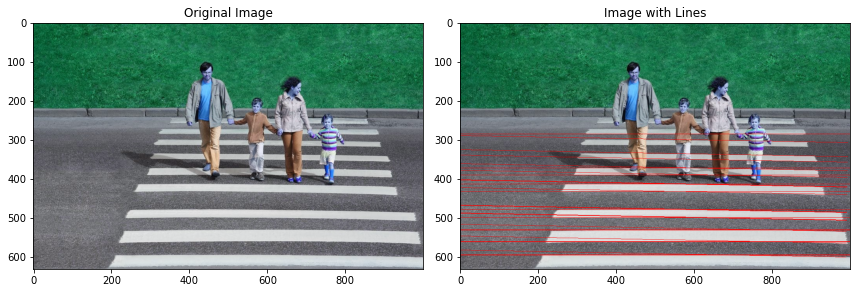

In [ ]:
img = cv2.imread('images/Crosswalk.jpg')
straight_lines(image_file=img, res_r=1, res_orient=1, min_number_points=150, display=1)

**Apply and answer**

1. Generate a synthetic image to test your Hough Transform algorithm.
   * Submit the image as well as the results.


2. Apply your algorithm to the following images: Crosswalk, linesOnTheRoadGray, Sudoku.
   * Choose a set of parameters so the results looks fine.
   * You may need different parameters for each image.
   * Display the results.
   
   
3. **Answer**: How the resolutions of $r$ and $\theta$ affect the results?
   * Display images that demonstarte your answer.
   
   
4. Choose one image and **answer**: how many straight lines did you find with more than 50 points?
   * Display these lines on the image.
   
   
5. Suggest an algorithm to compute the length of the line in the image.
   * Describe the algorithm without implementing it.
   
   
6. Suggest three applications to use the results of straight line detection in an image.



## <span style="color:blue"> Question A.1
    
The synthetic image generated for testing  Hough matrix, featuring a complex pattern of multiple straight lines and geometric shapes, was chosen for several reasons:

1. **Variety of Line Orientations**: The image includes lines at various angles, providing a comprehensive test for the line detection capabilities of the Hough transform. This variety ensures that the algorithm's ability to detect both vertical, horizontal, and diagonal lines is thoroughly tested.

2. **Complexity Without Overcrowding**: While the image is complex enough to provide a robust test, it is not overcrowded with details that might confuse the algorithm or create an excessive number of false positives. This balance is important to evaluate the algorithm's effectiveness in real-world scenarios.

3. **Clear and Distinct Lines**: The lines in the image are clear and distinct against a plain background, which is ideal for testing the basic functionality of the Hough transform. This clarity helps in initially validating the algorithm's effectiveness before moving on to more complex, real-world images where lines might not be as clearly defined.

Overall, the image was designed to be a challenging yet manageable test case for evaluating and fine-tuning a line detection algorithm based on the Hough transform.

Resolution R: 1
Resolution Orientation: 1
Minimum Number of Points on a line: 350
Number of lines on the picture higer then the threshhold: 87


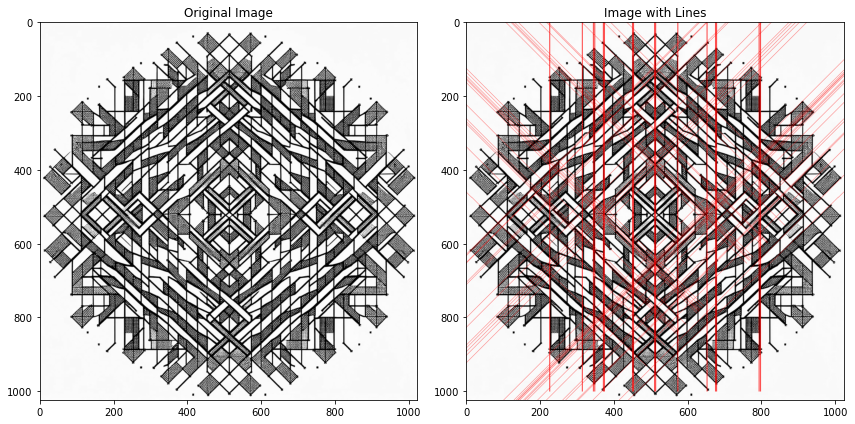

In [ ]:
synthetic_image = cv2.imread('images/synthetic_image.png', cv2.IMREAD_GRAYSCALE)
straight_lines(image_file=synthetic_image, res_r=1, res_orient=1, min_number_points=350, display=1)

## <span style="color:blue"> Question A.2


Resolution R: 1
Resolution Orientation: 1
Minimum Number of Points on a line: 200
Number of lines on the picture higer then the threshhold: 61


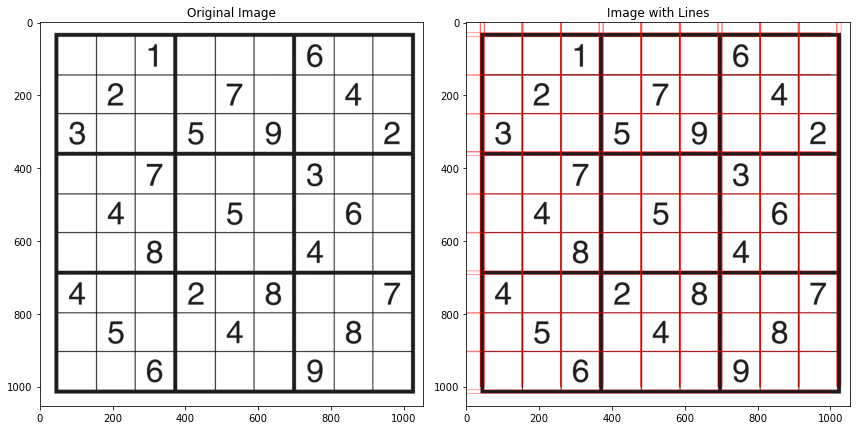

In [ ]:
img_sudoku = cv2.imread('images/Sudoku.PNG', cv2.IMREAD_GRAYSCALE)
straight_lines(image_file=img_sudoku, res_r=1, res_orient=1, min_number_points=200, display=1)

Resolution R: 1
Resolution Orientation: 2
Minimum Number of Points on a line: 150
Number of lines on the picture higer then the threshhold: 13


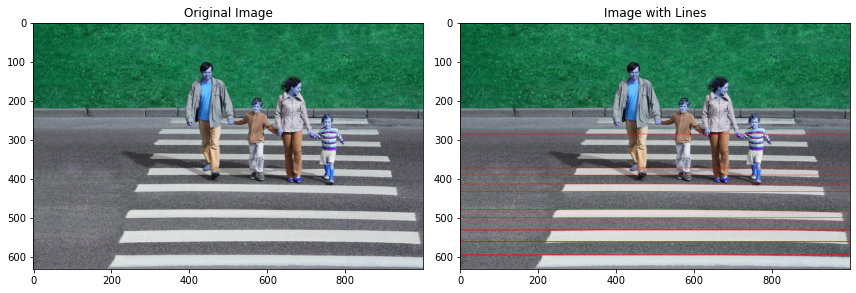

In [ ]:
img_crooswalk = cv2.imread('images/Crosswalk.jpg')
straight_lines(image_file=img_crooswalk, res_r=1, res_orient=2, min_number_points=150, display=1)

Resolution R: 1
Resolution Orientation: 1.7
Minimum Number of Points on a line: 60
Number of lines on the picture higer then the threshhold: 29


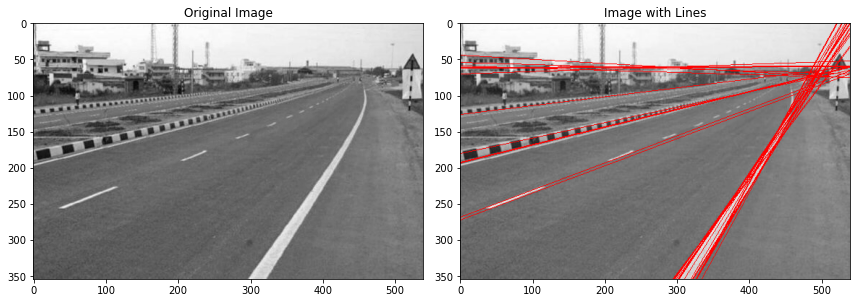

In [ ]:
img_linesOnTheRoadGray = cv2.imread('images/linesOnTheRoadGray.jpg', cv2.IMREAD_GRAYSCALE)
straight_lines(image_file=img_linesOnTheRoadGray, res_r=1, res_orient=1.7, min_number_points=60, display=1)

## <span style="color:blue"> Question A.3
    
The resolutions of $r$ and $\theta$ in a Hough Transform affect the results in the following ways:

1. **Resolution of \(r\):**
   - **Higher Resolution (Smaller \(r\) Steps):** When the resolution of \(r\) is higher (smaller \(r\) steps), it means that the Hough space is divided into smaller bins along the radial axis. This allows for more precise detection of lines with different distances from the origin.

   - **Lower Resolution (Larger \(r\) Steps):** Conversely, lower resolution for \(r\) means larger steps along the radial axis. This can lead to coarser detection of lines, where lines with similar distances from the origin may be grouped together in the same bin.
    
Meaning low resolution of $r$ will evantully increase the number of lines in the image

2. **Resolution of \(\theta\):**
   - **Higher Resolution (Smaller \($\theta$\) Steps):** A higher resolution for \($\theta$\) means smaller angular steps in the Hough space. This allows for more precise detection of lines with different orientations. It can detect lines at a finer angle granularity.

   - **Lower Resolution (Larger \($\theta$\) Steps):** Lower resolution for \($\theta$\) results in larger angular steps. This can lead to fewer distinct angle bins in the Hough space and coarser detection of lines. Lines with similar orientations may be grouped together.
    
Meaning low resolution of $\theta$\ will evantully decrease the number of lines in the image


In summary, Higher resolutions provide finer detection but require more resources, while lower resolutions are computationally efficient but may sacrifice accuracy in detecting lines with varying distances and angles. The optimal resolutions depend on the specific application and the characteristics of the input images.
    
**Here are few examples**

changing $\theta$ - 1, 2, 20:

In [ ]:
img_crooswalk = cv2.imread('images/Crosswalk.jpg')
straight_lines(image_file=img_crooswalk, res_r=1, res_orient=1, min_number_points=150, display=1)

In [ ]:
img_crooswalk = cv2.imread('images/Crosswalk.jpg')
straight_lines(image_file=img_crooswalk, res_r=1, res_orient=2, min_number_points=150, display=1)

In [ ]:
img_crooswalk = cv2.imread('images/Crosswalk.jpg')
straight_lines(image_file=img_crooswalk, res_r=1, res_orient=20, min_number_points=150, display=1)

In [ ]:
img_crooswalk = cv2.imread('images/Crosswalk.jpg')
straight_lines(image_file=img_crooswalk, res_r=0.3, res_orient=1, min_number_points=150, display=1)

In [ ]:
img_crooswalk = cv2.imread('images/Crosswalk.jpg')
straight_lines(image_file=img_crooswalk, res_r=1, res_orient=1, min_number_points=150, display=1)

In [ ]:
img_crooswalk = cv2.imread('images/Crosswalk.jpg')
straight_lines(image_file=img_crooswalk, res_r=3, res_orient=1, min_number_points=150, display=1)

## <span style="color:blue"> Question A.4

In [ ]:
img_crooswalk = cv2.imread('images/Crosswalk.jpg')
straight_lines(image_file=img_crooswalk, res_r=1, res_orient=1, min_number_points=50, display=1)

## <span style="color:blue"> Question A.5
    
In order to find the length of the line in the image we need to know 2 parameters:
1. **Where the line starts** - the point with the lowest value of X on the line.
2. **Where the line ends** - the point with the highest value of X on the line.

There is exception where the line is parallel to the X axis, meaning the line has the same X values and the $\theta$ (from $-$$\frac{\pi}{2}\ $to $\frac{\pi}{2}\$) is 0.


In this case:
    
1. **Where the line starts** - the point with the lowest value of Y on the line.
2. **Where the line ends** - the point with the highest value of Y on the line.
    
We have 2 different ways to implement this according the way we implement the Hough function but the priincipals will be the same -
1. Find the starting point - iterate over all the edges and save for each $r$ and $\theta\$ the point with the smallest values of the x (except where the line is parallel to the X axis)
   
2. Find the ending point - iterate over all the edges and save for each $r$ and $\theta\$ the point with the highest values of the x (except where the line is parallel to the X axis)
    
3. calculate the disatance between the points
    
for each approach we will find this values in a different way:
    
1. **Vectorized approach** - reverse engeneering for the $r$ matrix
  
    
    * we will take all the index where $r$ is equal for the same $\theta\$
    * from the index we will find the corresponding edges
    * extract the min x value and the max x value
    * calculate the distance
    

2. **Loop approach:**
    
    * For each edge we will calculate all the $r$ values according the  $\theta\$
    
    * for each $r$ and  $\theta\$ in the accumolator we will save the min and max x value
  
    * calculate the distance
    

## <span style="color:blue"> Question A.6
    
**applications to use the results of straight line detection in an image:**
    
1. **Autonomous Vehicles and Driver Assistance Systems**:
   - Straight line detection is crucial for identifying road lane markings. This helps in keeping autonomous vehicles within their lanes and assists in driving tasks like lane changes. Accurate detection of these lines ensures the vehicle navigates safely and follows traffic rules.
    
    
2. **Architectural and Engineering Design Analysis**:
   - In architecture and engineering, line detection is used to digitize building plans and mechanical drawings. By converting scanned blueprints into digital formats, professionals can easily edit and integrate them into modern CAD software, streamlining the design and modification process.
    

    
3. **Robotics and Automation**:
   - In robotics, line detection aids in navigation and object manipulation. For example, line-following robots in factories use detected lines to navigate. Additionally, in automated quality control, detecting straight lines helps inspect products for manufacturing accuracy and consistency.

In each application, the accuracy of line detection is key to ensuring the system operates effectively, whether it's for safe navigation, precise digitization, or reliable automated inspection.

## <span style="color:blue">Section B: Patch Matching
**In this part you will match intrest points between two images.**
    
    
There are two functions between vectors $v$ and $u$ that you will consider:\
a. Distance: Sum of Square Distance (SSD). That is,  $SSD(u,v)=(u-v)\cdot(u-v)$.\
b. Similarity: Normalized Cross Correlation (NCC). That is,  $NCC(u,v)={u\cdot v \over ||u||||v||}$.


The patch descriptor:
1. A vector with the pixels' grey level.
2. An histogram (30 bins) of the pixels' grey level.
3. A vector with the pixels' strength gradient.
4. An histogram (30 bins) of the pixels' strength of gradient.


In [ ]:
#Implement the following functions:

# Input: two vectors
# Output distance (scalar) between two patches

def  SSD(patch_descr_1, patch_descr_2):

    # Calculate the Euclidean distance between the two vectors
    euclidean_distance = np.linalg.norm(patch_descr_1 - patch_descr_2)

    # Square the Euclidean distance to get the sum of squared distances
    sum_squared_distance = euclidean_distance ** 2

    return sum_squared_distance

# Input: two vectors
# Output normalized cross correlation  (scalar) between two patches

def NCC(patch_descr_1, patch_descr_2):

    # Calcaulte the dot product of the vectors
    nominator = patch_descr_1 @ patch_descr_2.T

    # Calcaulte the product of the norms
    denominator = np.linalg.norm(patch_descr_1) * np.linalg.norm(patch_descr_2)

    return nominator/denominator

# Output a descriptor vector
# im is an image, p is a pixel, size is the patch size.
# You can use the histogram function of open cv or numpy


def patch_from_im(im,p,size):

    # Create the patch
    patch = create_patch(im,p,size)

    # Flatten the patch
    patch_vector = patch.flatten()

    return patch_vector


def hist_patch_im(im,p,size):


    # Apply patch_from_im to create a vector of pixels
    patch_vector = patch_from_im(im,p,size)

    # Creating a histogram with 30 bins
    hist_patch, _ = np.histogram(patch_vector, bins=30)

    return hist_patch


def gradient(im,p,size):

    # Calculate the gradient according to gradient magnitude. Type float - for the future broadcasting (gradient magnitude)
    x_mask = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float64)
    y_mask = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=np.float64)

    # Create the patch
    patch = create_patch(im=im ,p=p ,size=size)

    # Calculate the gradients
    Ix = convolutionMask(img=patch, mask=x_mask)
    Iy = convolutionMask(img=patch, mask=y_mask)

    # Calculate the gradient magnitude
    gradient_p = np.sqrt(np.square(Ix), np.square(Iy))


    #flatten the matrix to vector
    return gradient_p.flatten()


def hist_gradient(im,p,size):

    # apply gradient to get a gradient vector
    gradient_vector = gradient(im,p,size)

    # Creating a histogram with 30 bins
    hist_gradien, _ = np.histogram(gradient_vector, bins=30)

    return hist_gradien


def create_patch(im,p,size):
    """
    Return a patch around a given pixel.

    Parameters:
    - im (numpy.ndarray): The input image.
    - p (tuple): indeces of the pixel in the given image
    - size (int): the length of a side in the sqaure of the parth (For examplke 5*5 patch - size=5)
    """

    # Calculate the indices for the patch. for frame pixels - begin from 0/the end of the row/col
    p_coordinates = p[0]

    half_size = size // 2 # round it to an integer
#     top = max(p_coordinates[0] - half_size, 0)
#     end_x = min(p_coordinates[0] + half_size + 1, im.shape[0])
#     start_y = max(p_coordinates[1] - half_size, 0)
#     end_y = min(p_coordinates[1] + half_size + 1, im.shape[1])

    top = max(p_coordinates[0] - half_size, 0)
    left = max(p_coordinates[1] - half_size, 0)
    bottom = min(p_coordinates[0] + half_size + 1, im.shape[0])
    right = min(p_coordinates[1] + half_size + 1, im.shape[1])

    # Create the patch
#     patch = im[start_x:end_x, start_y:end_y]
      # Extract the patch
    patch = im[top:bottom, left:right]

    # Pad the patch if it's near the edges
    if (p_coordinates[0] - half_size < 0) or (p_coordinates[1] - half_size < 0) or (p_coordinates[0] + half_size + 1 or im.shape[0]) or (p_coordinates[1] + half_size + 1 > im.shape[1]):
        pad_top = max(half_size - p_coordinates[0], 0)
        pad_left = max(half_size - p_coordinates[1], 0)
        pad_bottom = max((p_coordinates[0] + half_size + 1) - im.shape[0], 0)
        pad_right = max((p_coordinates[1] + half_size + 1) - im.shape[1], 0)
        patch = np.pad(patch, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='mean')

    return patch

#import convolve2d - as in the first excercise
from scipy.signal import convolve2d


def convolutionMask(img,mask):
    # mask using convolve2d
    masked_image = convolve2d(img, mask, mode='same', boundary='fill', fillvalue=0)
    return masked_image

**Apply and answer**


1. Compute the corners in a pair of images (e.g., view0.tif and view6.tif).


2. Choose up to 2000 of the strongest corners (you can use fewer) and find a matching between the corners in the pair of images.
    * Choose a fixed scale and use it to define a patch around each corner.
    * To display the matching, use the function cv2.hconcat([im1, im2]), which concatenates two images horizontally, and then draw lines as described in the previous section.


3. Use up to 4000 of the strongest corners (you can use fewer) in each image and use the matching only between corners that have approximately the same y-coordinate (up to a threshold).


4. Study the ratio for matching between the best and the second best match.
   * You can use NCC or SSD on the desriptor of your choice.
   * You can use without (2) or with (3) the $y$-coordinate constraint.
   * **Present** examples that demonstrate the effectiveness of using the ratio.


5. Study the differences between the different descriptors and also the use of SSD or NCC.
   * **Present**  examples that demonstrate your findings.


6. Identify incorrect pairs of matched points.\
   **Mark and display** for cases (2), (3), and (4) a pair of incorrectly matched points.\
   **Answer**\
   a. In which of the 3 cases are there more incorrect matches?\
   b. What may be the reason for the incorrect matches?


7. In which regions of the scene were most of the reliable matches found?



**Implementation details**

You can compute the NCC or SSD patch by patch. This will probably takes longer than using matrix multiplications of numpy.

Using matrices:
1. Generate a 1D vector from each descriptor.


2. Generate a matrix $M_1$:  rows  are  the descriptors of img1.


3. Generate a matrix $M_2$:  columns  are  the descriptors of img2.


4. $M=np.matmul(M_1,M_2)$\
   * what is the value in $M(i,j)$?


5. Think of how to normalize the set of patches, if you need.
   * You can consider using the function np.diag(np.diag(matrix)) as part of your solution.
    
    

## Harris corner detector from EX_1

In [ ]:
def derive_Gaussian(x, y,sig=1.0):
    """
    Returns a tuple of 2 values - a 2D Gaussian distribution (mu is 0, std is sig) directional derivatives.

    Parameters:
    - x (float/int/array): the x coordinate
    - y (float/int/array): the y coordinate
    - sig (float): The std of the 2D Gaussian filter
    """
    dx = (-x/(2*np.pi*sig**4))*np.exp(-(np.square(x) + np.square(y))/(2*sig**2))
    dy = (-y/(2*np.pi*sig**4))*np.exp(-(np.square(x) + np.square(y))/(2*sig**2))
    return dx,dy



def Deriv_Gauss_xy(sigma=1):
    """
    Returns a tuple of 2 masks (matrices - 2D numpy arrays) that represents the Gaussian Filter, G_dx and G_dy.

    Parameters:
    - sigma (integer): The std of the 2D Gaussian filter (defines the Gaussian, mu=0 as default)
    """

    # Make sure that sigma is an integer for the grid
    if isinstance(sigma, float):
        sigma = round(sigma)
        print(f"Sigma is a float and has been rounded to {sigma}.")


    # define the coordinates according to sigma - 6*sigma+1
    x = np.linspace(-3*sigma, 3*sigma, 6*sigma+1)
    y = np.linspace(-3*sigma, 3*sigma, 6*sigma+1)

    # Create a grid of coordinates (integers)
    x, y = np.meshgrid(x, y)

    return derive_Gaussian(x,y, sig=sigma)



def Grad_xy(img=None,  sigma_smooth=1):
    """
    Returns 2 matrices (2D numpy arrays): the gradients over x and y of the image according to Gaussian filter.

    Parameters:
    - img (2D numpy array): a 2 dimension matrix that represnts a grayscale of an image. Motice there is no RGB dimension.
    - sigma_smooth (integer): The std of the 2D Gaussian filter. Defines how much to smooth the image before deriving (higher sigma higher smoothing)
    """

    # Ceate Gaussian filters (x and y axes)
    G_dx, G_dy = Deriv_Gauss_xy(sigma=sigma_smooth)

    # Calculate the Gradient in the x axe using the Gaussian filter
    Ix = convolutionMask(img=img, mask=G_dx)

    # Calculate the Gradient in the y axe using the Gaussian filter
    Iy = convolutionMask(img=img, mask=G_dy)

    return Ix, Iy


def Gaussian_mask(sigma=1):
    """
    Returns a matrix (2D numpy array) of length 6*sigma+1: the Gaussian filter

    Parameters:
    - img (2D numpy array): a 2 dimension matrix that represnts a grayscale of an image. Motice there is no RGB dimension.
    - sigma (integer): The std of the 2D Gaussian filter. Defines how smoothing the mask will be.
    """
    # define the coordinates according to sigma - 6*sigma+1
    x = np.linspace(-3*sigma, 3*sigma, 6*sigma+1)
    y = np.linspace(-3*sigma, 3*sigma, 6*sigma+1)

    # Create a grid of coordinates (integers)
    x, y = np.meshgrid(x, y)

    # Caulculate Gaussian function
    Gausian_Kernel = (1/(2*np.pi*sigma**2))*np.exp(-(np.square(x) + np.square(y))/(2*sigma**2))

    # Return a normalized mask
    return Gausian_Kernel / np.sum(Gausian_Kernel)



def squared_derivatives(Ix, Iy):
    """
    Returns a tuple of 3 matrices (2D numpy arrays): the submatrices Ix^2, Iy^2, Ix*Iy (for the Harris Matrix)

    Parameters:
    - Ix (2D numpy array): the gradients over x direction
    - Iy (2D numpy array): the gradients over y direction
    """

    Ix_square = Ix ** 2
    Iy_square = Iy ** 2
    IxIy = Ix * Iy

    return Ix_square, Iy_square, IxIy




# Function to compute d(q) for each pixel
def ComputeDq(Ix, Iy, sigma_neigh=1,  k=0.04):
    """
    Returns a Matrix (2D numpy arrays) that containts dq for each pixel

    Parameters:
    - Ix (2D numpy array): the gradients over x direction
    - Iy (2D numpy array): the gradients over y direction
    - sigma_neigh (integer): The std of the 2D Gaussian filter. Defines how smoothing the mask will be.
    - k (float): Weight of the trace when  calculating dq
    """
    # Calculate the squared derivatives matrices
    Ix_square, Iy_square, IxIy = squared_derivatives(Ix, Iy)

    # Crate a Gaussian Mask
    Gausian_Kernel = Gaussian_mask(sigma=sigma_neigh)

    # Submatrices of C
    C11 = convolutionMask(Ix_square,Gausian_Kernel)
    C12 = convolutionMask(IxIy,Gausian_Kernel)
    C22 = convolutionMask(Iy_square,Gausian_Kernel)

    # Compute the Determinant and the Trace
    det_C = C11 * C22 - C12**2
    trace_C = C11 + C22

    # Compute Dq matrix according to Harris algorithm
    Dq = det_C - k * trace_C**2

    return Dq


def Find_corners(Dq, th=27, density_size=20, statistic_th=False):
    """
    Returns a list of tuples, where each tuple contains a coordinate (tuple) and a dq value (float)

    Parameters:
    - Dq (2D numpy array): a Matrix (2D numpy arrays) that containts dq for each pixel
    - th (float): threshold for dq
    - density_size (int): size of a "neighborhood" (from each neighborhood, only 1 pixel can be detected as a corner)
    - statistic_th (boolean): if True then th is percentage [0,100) of the dq value in the matrix Dq [0,100). If False it is absolute value.
    """
    # List of Corners
    corners = []
    unthreshold_corners = []

    if statistic_th:
        th = np.percentile(Dq, th)

    # Save variables to iterate over Dq
    rows, cols = Dq.shape

    # Iterate over Dq's submatrices of density_size*density_size (neighborhoods). Iterate Using 2 nested for loops -
    # There is no efficent vectorized way of iterating over submatrices, and it is only 2 nested loops (pretty efficient)
    for i in range(1, rows - density_size + 1, density_size-1):
        for j in range(1, cols - density_size + 1, density_size-1):
            neighborhood = Dq[i:i + density_size, j:j + density_size]

            # Check that there are non-zero elements in the submatrix
            if not np.all(neighborhood == 0):

                # save the maximum dq - value and position
                max_dq = np.max(neighborhood)
                max_pos = np.unravel_index(np.argmax(neighborhood), neighborhood.shape)

                # Adjusting max_pos to the coordinates in the original matrix
                unthreshold_corners.append(((i + max_pos[0], j + max_pos[1]), max_dq))

                # apply the threshold
                if max_dq > th:
                    corners.append(((i + max_pos[0], j + max_pos[1]), max_dq))

    return corners, unthreshold_corners



def display_results(img, corners, unthreshold_corners, Ix, Iy):
    """
    Display the followings:
    a. The original image.
    b. The derivatives of the images, 𝐼𝑥 and  𝐼𝑦
    c. The values of the corner strength before appying the threshold.
    d. The values of the corner strength after appying the threshold.
    e. The detected corners overlayed on the original image.

    Parameters:
    - img (2D numpy array): a 2 dimension matrix that represnts a grayscale of an image. Motice there is no RGB dimension.
    - corners (list): list of tuple [coordinates(tuple) and dq(float)] of corners in the input image (after applying threshold)
    - unthreshold_corners (list): list of tuple [coordinates(tuple) and dq(float)] of corners in the input image (before applying threshold)
    - Ix (2D numpy array): the gradients over x direction
    - Iy (2D numpy array): the gradients over y direction    - k (float): Weight of the trace when  calculating dq
    """


    img_rgb=draw_corners(img=img, corners=corners)
    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.title("Detected Corners Overlayed on the Image")  # Adding a title
    plt.axis('off')  # Remove axis ticks
    plt.show()



def draw_corners(img, corners):
    """
    Display the detected corners overlayed on the original image.

    Parameters:
    - img (2D numpy array): a 2 dimension matrix that represnts a grayscale of an image. Motice there is no RGB dimension.
    - corners (list): list of tuple [coordinates(tuple) and dq(float)] of corners in the input image (after applying threshold)
    """
    # Convert grayscale image to RGB
    img_rgb = np.stack((img,)*3, axis=-1)

    # Draw Red dots for each corner
    for corner in corners:
        y, x = corner[0]  # Swap x and y for correct indexing

        # Ensure we stay within image bounds
        img_rgb[max(y-2, 0):min(y+3, img_rgb.shape[0]), max(x-2, 0):min(x+3, img_rgb.shape[1]), 0] = 255  # Red channel
        img_rgb[max(y-2, 0):min(y+3, img_rgb.shape[0]), max(x-2, 0):min(x+3, img_rgb.shape[1]), 1] = 0.0  # Green channel
        img_rgb[max(y-2, 0):min(y+3, img_rgb.shape[0]), max(x-2, 0):min(x+3, img_rgb.shape[1]), 2] = 0.0  # Blue channel

    return img_rgb



def display_corners(img, corners_list):
    """
    Returns a 2D np.array with white pixels (relativley to the strength of the corner)

    Parameters:
    - img (2D numpy array): a 2 dimension matrix that represnts a grayscale of an image. Motice there is no RGB dimension.
    - corners_list (list): list of tuple [coordinates(tuple) and dq(float)] of corners in the input image (after applying threshold)
    """

    # List of the dq strngths
    strengths = [corner[1] for corner in corners_list]

    # Normalize strengths to 1-255 by (10,90) percentile
    normalized_strengths = np.interp(strengths, (np.percentile(np.array(strengths), 20),
                                                 np.percentile(np.array(strengths), 80)), (1, 255))

    # extract coordinates using the input list (the first element in the tuple - every element in the list is a tuple )
    coordinates = [corner[0] for corner in corners_list]

    # Create a black image with the same dimensions as 'img'
    height, width = img.shape
    background_image = np.zeros((height, width), dtype=np.uint8)

    # Draw the pixels on the background image according to their normalized strength
    for coord, strength in zip(coordinates, normalized_strengths):
        x, y = coord
        background_image[x, y] = int(strength)

    return background_image




def H_corner(img, sigma_smooth=1, sigma_neigh=1, k=0.04, th=27, density_size=5, display=1, statistic_th=False):
    """
    Returns a list of tuple [coordinates(tuple) and dq(float)] that represents corners in the input image

    Parameters:
    - img (2D numpy array): a 2 dimension matrix that represnts a grayscale of an image. Motice there is no RGB dimension.
    - sigma_smooth (integer): The std of the 2D Gaussian filter. Defines how much to smooth the image before deriving (higher sigma higher smoothing)
    - sigma_neigh (integer): The std of the 2D Gaussian filter. Defines how smoothing the mask will be.
    - k (float): Weight of the trace when  calculating dq
    - th (float): threshold for dq
    - density_size (int): size of a "neighborhood" (from each neighborhood, only 1 pixel can be detected as a corner)
    - display(int): binary integer, wether to display the coreners on top of the original image
    - statistic_th (boolean): if True then th is percentage [0,100) of the dq value in the matrix Dq [0,100). If False it is absolute value.    """

    # If we chose statistic_th - check that th is a legal percentage
    if statistic_th:
        if th<0 or th >=100 :
            print(f'th {th} is not a legal percentage threshold')
            return


    # Compute the gradient matrices
    Ix, Iy = Grad_xy(img,  sigma_smooth=sigma_smooth)

    # Compute Dq
    Dq = ComputeDq(Ix, Iy, k=k)

    # Find the corners in each neighborhood
    corners, unthreshold_corners = Find_corners(Dq, th=th, density_size=density_size, statistic_th=statistic_th)

    if display==1:
        display_results(img=img, corners=corners, unthreshold_corners=unthreshold_corners, Ix=Ix, Iy=Iy)


    return corners


## Apply Harris corner detector and find the 2000 strongest corners

In [ ]:
def match_corners(img_1_dir=None, img_2_dir=None, patch_size=16, number_of_corners=1000, SSD_th=10**10, NCC_th=0.0,
                  descriptors=[patch_from_im, hist_patch_im, gradient, hist_gradient],
                  descriptors_names=['grey_level_vector', 'grey_level_histogram', 'gradient_vector', 'gradient_hist'],
                  y_th=None, d_ratio=False, d_ratio_th=1.0, NCC_display=True, ratio_hist_display=True):
    """
    Find corners of 2 images using Harris corner detector, generate 4 kinds of descriptors (pixels gray-level, grey-level histogram, gradient magnitude, gradient magnitude histogram)
    for each corner, find matching corners using SSD and NCC and plot the results.

    Parameters:
    - img_1_dir (string): directory of the first image.
    - img_2_dir (string): directory of the second image.
    - patch_size (int): size of the patch for the descriptors.
    - number_of_corners (int): number of strongest corners to pick from each image
    - SSD_th (float): Maximum threshold for matching using SSD
    - NCC_th (float): Minimum threshold for matching using NCC
    - descriptors (list): list of names of different function to generate a descriptor. Defaulted according to the assignment
    - descriptors_names (list): list of strings (names of the descriptor). Defaulted according to the assignment, must be matched to descriptors
    - y_th (int): a threshold for the y coordinate distance from the matching corner. Defaulted to None - no threshold
    - d_ratio (boolean): If True, for SSD check the ratio between the minimum and 2nd minimum SSD valued for each vector. Plot the ratios for all vectors.
    - d_ratio_th (float) : If d_ratio is True, then apply a threshold for ratio. only corners that has bigger ratio than d_ratio_th will get a match
    - NCC_display (boolean) : If true, plot the results of NCC.
    - ratio_hist_display (boolean) : If true, plot the histogram of the ratios of SSD.
    """


    img_1 = cv2.imread(img_1_dir,  cv2.IMREAD_GRAYSCALE)
    img_2 = cv2.imread(img_2_dir,  cv2.IMREAD_GRAYSCALE)


    # Slice the strongest number_of_corners
    img_1_strongest_corners = slice_corners(img=img_1, number_of_corners=number_of_corners, patch_size=patch_size)
    img_2_strongest_corners = slice_corners(img=img_2, number_of_corners=number_of_corners, patch_size=patch_size)

    # Generate descriptors for each cornter
    descriptors_img_1 = generate_corners_descriptors(img=img_1, pixels=img_1_strongest_corners, patch_size=patch_size, vstack=True, descriptors=descriptors, descriptors_names=descriptors_names)
    descriptors_img_2 = generate_corners_descriptors(img=img_2, pixels=img_2_strongest_corners, patch_size=patch_size, vstack=False, descriptors=descriptors, descriptors_names=descriptors_names)


    # Create empty dictionarys
    SSDs = {}
    NCCs = {}

    # For each type of descriptor, calculate SSD and NCC for img_1 and img_2
    for descriptor_name in descriptors_names:
        cur_SSD_NCC = Matrix_SSD_NCC(M_1 = descriptors_img_1[descriptor_name], M_2 = descriptors_img_2[descriptor_name])
        SSDs[descriptor_name] = cur_SSD_NCC[0]
        NCCs[descriptor_name] = cur_SSD_NCC[1]

    # Use the draw_matches function and plot the results using matplotlib
    for descriptor_name in descriptors_names:

        # Assign a variable  as the number of matches - the minimum number of corners
        num_matches = min(len(img_1_strongest_corners), len(img_2_strongest_corners))

        # lists of tuples - indices of the matching vectors (row\column)
        matches_ssd = []
        matches_ncc = []

        # list of ratios for SSD values
        if d_ratio:
            ssd_ratios = []


        # Iteate over the descriptors in the first image
        for i in range(num_matches):
            # Get the SSD values for the i-th corner in img_1
            ssd_values = SSDs[descriptor_name][i]

            # Check for negative values in ssd_values
            negative_values = [value for value in ssd_values if value < 0]
            if negative_values:
                print(f"Negative SSD values for vector {i}: {negative_values}")

            # Get the NCC values for the i-th corner in img_1
            ncc_values = NCCs[descriptor_name][i]

            # Get the y coordinate of the i-th corner in img_1. It is opposite (the first coordinate)
            y_coord_img1 = img_1_strongest_corners[i][0][0]

            # Apply y_th only if exists
            if type(y_th)==int:
                # Filter corners in img_2 based on y coordinate difference and SSD threshold
                valid_indices_SSD = [j for j, corner in enumerate(img_2_strongest_corners)
                                 if abs(corner[0][0] - y_coord_img1) <= y_th and ssd_values[j] <= SSD_th]

                # Filter corners in img_2 based on y coordinate difference and NCC threshold
                valid_indices_NCC = [j for j, corner in enumerate(img_2_strongest_corners)
                             if abs(corner[0][0] - y_coord_img1) <= y_th and ncc_values[j] >= NCC_th]
            else:
                valid_indices_SSD = [j for j, _ in enumerate(img_2_strongest_corners) if ssd_values[j] <= SSD_th]
                valid_indices_NCC = [j for j, _ in enumerate(img_2_strongest_corners) if ncc_values[j] >= NCC_th]

            # If there exist a matching - find the best match (minimum or maximum)
            if valid_indices_SSD:

                # If d_ratio paramter is applied and there is more than 1 valied matched j vector
                if d_ratio and len(valid_indices_SSD) > 1:

                    # Sort the list according to the SSD value
                    sorted_indices = sorted(valid_indices_SSD, key=lambda j: ssd_values[j])

                    #  Assign the minimum and the 2nd minimum valued
                    min_ssd_index = sorted_indices[0]
                    second_min_ssd_index = sorted_indices[1]

                    # Compute the SSD ratio
                    ssd_ratio = ssd_values[min_ssd_index] / ssd_values[second_min_ssd_index]

                    # Add to the list
                    ssd_ratios.append(ssd_ratio)

                    # Apply the threshold on the matchings
                    if ssd_ratio <= d_ratio_th:
                        matches_ssd.append((i, min_ssd_index))

                # No threshold for the SSD ratios
                else:
                    # Find the index with minimum SSD among valid corners
                    min_ssd_index = valid_indices_SSD[np.argmin([ssd_values[j] for j in valid_indices_SSD])]
                    matches_ssd.append((i, min_ssd_index))

            if valid_indices_NCC:
                # Find the index with maximum NCC among valid corners
                max_ncc_index = valid_indices_NCC[np.argmax([ncc_values[j] for j in valid_indices_NCC])]
                matches_ncc.append((i, max_ncc_index))


        # Plot the SSD ratios if d_ratio is True
        if d_ratio and ratio_hist_display:
            plt.figure(figsize=(10, 5))
            plt.hist(ssd_ratios, bins=len(ssd_ratios)//4, edgecolor='black')
            plt.xlabel('SSD ratio')
            plt.ylabel('Count')
            plt.title(f'Histogram of SSD ratios, descriptor: {descriptor_name}')
            plt.show()


        # Plot a horizntal stacked imaged with both images and lines between the corners
        img_matches_ssd = draw_matches(img_1, img_2, img_1_strongest_corners, img_2_strongest_corners, matches_ssd)
        plt.figure(figsize=(16, 8))
        plt.imshow(img_matches_ssd, cmap='gray')

        if d_ratio:
            plt.title(f'SSD Matches - {descriptor_name}, SSD ratio threshold: {d_ratio_th}, SSD_th - {SSD_th}')

        else:
            plt.title(f'SSD Matches - {descriptor_name}, SSD_th - {SSD_th}')

        plt.axis('off')
        plt.show()

        # Plot NCC resulsts only when not checking the ratios
        if not d_ratio and NCC_display:
            # Plot a horizntal stacked imaged with both images and lines between the corners
            img_matches_ncc = draw_matches(img_1, img_2, img_1_strongest_corners, img_2_strongest_corners, matches_ncc)
            plt.figure(figsize=(16, 8))
            plt.imshow(img_matches_ncc, cmap='gray')
            plt.title(f'NCC Matches - {descriptor_name}, NCC_th - {NCC_th}')
            plt.axis('off')
            plt.show()



def slice_corners(img=None, number_of_corners=1000, patch_size=16):
    """
    Slice the strongest corners of an image using Harris corner detector.
    Parameters:
    - img (string): directory of the image.
    - number_of_corners (int): number of strongest corners to pick from each image

    Returns a list of tuples, which are coordinates of corners
    """
    # Apply Harris corner detector to find the corners
    img_corners = H_corner(img, sigma_smooth=1, sigma_neigh=1, k=0.04, th=95, density_size=20, display=0, statistic_th=True)

    sorted_img_corners = sorted(img_corners, key=lambda x: x[1], reverse=True)


    # Variables to filter edge corners
    patch_half = patch_size // 2
    height, width = img.shape[0], img.shape[1]

    img_strongest_corners = []

    # Iterate over sorted corners and add to list if not too close to edge
    for corner in sorted_img_corners:
        x, y = corner[0]
        if x > patch_half and y > patch_half and x < height - patch_half and y < width - patch_half:
            img_strongest_corners.append(corner)
            if len(img_strongest_corners) == number_of_corners:
                break

    return img_strongest_corners






def generate_corners_descriptors(img, pixels, patch_size=16, vstack=True, descriptors=[patch_from_im, hist_patch_im, gradient, hist_gradient], descriptors_names=['grey_level_vector', 'grey_level_histogram', 'gradient_vector', 'gradient_hist']):
    """
    Generate  descriptors as given (pixels gray-level, grey-level histogram, gradient magnitude, gradient magnitude histogram)
    for each pixel in a given list of pixels.
    Parameters:
    - img (2D numpy array): a 2 dimension matrix that represnts a grayscale of an image. Motice there is no RGB dimension.
    - pixels (list): list of tuple of coordinates
    - patch_size (int): size of the patch for the descriptors.
    - vstack (boolean): stack the descriptors vertically if True, Horizentally if False. Must be diffrent between 2 compared images.
    - descriptors (list): list of names of different function to generate a descriptor. Defaulted according to the assignment
    - descriptors_names (list): list of strings (names of the descriptor). Defaulted according to the assignment, must be matched to descriptors

    Returns a dictionary of 4 matrices, each matrix is stacked descriptors of 1 kind
    """

    # Create an empty dictionary
    descriptors_matrices={}

    # Assign variables to filter edge pixels
    patch_half = patch_size // 2
    height, width = img.shape[0], img.shape[1]
#     print(f'\ndescriptors:{descriptors}, descriptors[0]:{descriptors[0]}')
    # Iterate over all the descriptor functions
    for i, descriptor_function in enumerate(descriptors):

        # Initialize an empty list of vectors
        descriptors_list = []

        # iterate over every pixel
        for pixel in pixels:


            # Run the function and generate the descriptor
            cur_descriptor = descriptor_function(im=img, p=pixel ,size=patch_size)
#             print(f'\ncur_descriptor:\n{cur_descriptor}')
            # if hstack - reshape the vector
            if not vstack:
                cur_descriptor = cur_descriptor.reshape(-1, 1)
            # Add the descriptor to the list of descriptors
            descriptors_list.append(cur_descriptor)
#         print(f'descriptors_list:\n{descriptors_list}')
        # vstack/hstack the vectors
        if vstack:
            descriptors_matrix = np.vstack(descriptors_list)

        else:
            descriptors_matrix = np.hstack(descriptors_list)

        # add the matrix to the dictionary of matrices
        descriptors_matrices[descriptors_names[i]] = descriptors_matrix

    return descriptors_matrices



def Matrix_SSD_NCC(M_1, M_2, SSD_bol=True, NCC_bol=True):
    """
    Compute the SSD and NCC over matrices that contains multiple descriptors
    Parameters:
    - M_1 (2D numpy array): a 2 dimension matrix, s.t each row represents a descriptor
    - M_2 (2D numpy array): a 2 dimension matrix, s.t each column represents a descriptor. Notice the M2 is already transposed becauew of the v_stack.
    - SSD_bol (boolean): Wether to calcaulte SSD values. Defaulted True.
    - NCC_bol (boolean): Wether to calcaulte NCC values. Defaulted True.
    Returns a tuple of 2 Matrices M_SSD and M_NCC (if 1 of the bol variables is False - returns a single Matrix)
    In each matrix the i,j cell represent the SSD/NCC of the i'th corner in M1 and the j'th corner in M2.
    """

    M1 = M_1.astype(np.int64).copy()
    M2 = M_2.astype(np.int64).copy()

    # Matmul the matrices for dot product
    u_dot_v = M1 @ M2

    # Squared normal - the diagonal of the matmul (matrix with it's trnaposed)

    M1_norms_sq = np.diag(M1 @ M1.T)

    M2_norms_sq = np.diag(M2.T @ M2)  # Sum of squares along columns - M2 was vstack. vector length is as number of derscriptors

    # Replace zeros with a small number (epsilon) to avoid division by zero
    epsilon = np.finfo(float).eps
    M1_norms_sq = np.where(M1_norms_sq == 0, epsilon, M1_norms_sq)
    M2_norms_sq = np.where(M2_norms_sq == 0, epsilon, M2_norms_sq)

    if SSD_bol:
        # Create coordinate matrices using meshgrid
        M1_norms_sq_grid, M2_norms_sq_grid = np.meshgrid(M1_norms_sq, M2_norms_sq, indexing='ij')

        # Calculating M_SSD
        M_SSD = M1_norms_sq_grid + M2_norms_sq_grid - 2 * u_dot_v

    if NCC_bol:
        # Calculate square roots of norms for M_NCC
        M1_norms = np.sqrt(M1_norms_sq)
        M2_norms = np.sqrt(M2_norms_sq)

        # Create coordinate matrices for M_NCC
        M1_norms_grid, M2_norms_grid = np.meshgrid(M1_norms, M2_norms, indexing='ij')

        # Calculating M_NCC
        M_NCC = u_dot_v / (M1_norms_grid * M2_norms_grid)

    # Return a Tuple of matrcies
    if SSD_bol and NCC_bol:
        return M_SSD, M_NCC

    elif not SSD_bol and NCC_bol:
        return M_NCC

    elif SSD_bol and not NCC_bol:
        return M_SSD



def draw_matches(img1, img2, corners1, corners2, matches):
    """
    Draws lines between matching corners of two images and concatenates the images horizontally.

    Parameters:
    - img1 (numpy.ndarray): The first image (grayscale) in which corners were detected.
    - img2 (numpy.ndarray): The second image (grayscale) in which corners were detected.
    - corners1 (list of tuples): A list where each element is a tuple containing the coordinates (tuple) of a corner in the first image and its strength (float).
    - corners2 (list of tuples): A list where each element is a tuple containing the coordinates (tuple) of a corner in the second image and its strength (float).
    - matches (list of tuples): A list of tuples where each tuple (i, j) represents a match; corner 'i' in the first image matches with corner 'j' in the second image.

    Returns:
    - img_matches (numpy.ndarray): The concatenated image with matching lines drawn between the two input images.

    The function concatenates the two images horizontally, then for each match in 'matches', it draws a line from the corner in the first image to the matching corner in the second image.
    """
    # Concatenate images horizontally using cv2.hconcat
    img_matches = cv2.hconcat([img1, img2])


    img_matches = cv2.cvtColor(img_matches, cv2.COLOR_GRAY2BGR)
    # Calculate width of the first image
    w1 = img1.shape[1]

    # Show the corners over the images
    for pt in corners1:
        cv2.circle(img_matches, (int(pt[0][1]), int(pt[0][0])), 4, (0, 0, 255), -1)  # Red circles in img1
    for pt in corners2:
        cv2.circle(img_matches, (int(pt[0][1] + w1), int(pt[0][0])), 4, (255, 0, 0), -1)  # Blue circles in img2

    # Draw lines between matching corners
    for i, j in matches:
        pt1 = (int(corners1[i][0][1]), int(corners1[i][0][0]))
        pt2 = (int(corners2[j][0][1] + w1), int(corners2[j][0][0]))

        color = (np.random.randint(0, 255), np.random.randint(0, 255), np.random.randint(0, 255))
        cv2.line(img_matches, pt1, pt2, color, 2)

    return img_matches


### In section B, unless mentioned, SSD and NCC threholds were assigned to irrelevant threholds - 10**10, 0.0 respectively  (in order to study other parameters).

## B.1 + B.2
B.1 is contained in the function match_corners

For 1,000 corners:

SSD threshold = 10**5, NCC threshold = 0.98

(Each descriptor should be tuned to different thresholds, but we first examined with fixed thresholds)

In [ ]:
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=1000, SSD_th=10**5, NCC_th=0.98)

For 30 corners:

SSD threshold = 10**6, NCC threshold = 0.9

Less corners - Thresholds are much less stricted

In [ ]:
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=30, SSD_th=10**6, NCC_th=0.9)

## B.3 - y_th = 3

2,000 corners:

SSD threshold = 10**5, NCC threshold = 0.98


In [ ]:
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=20, number_of_corners=2000, SSD_th=10**5, NCC_th=0.98, y_th=3)

30 corners:

SSD threshold = 10**10, NCC threshold = 0.0

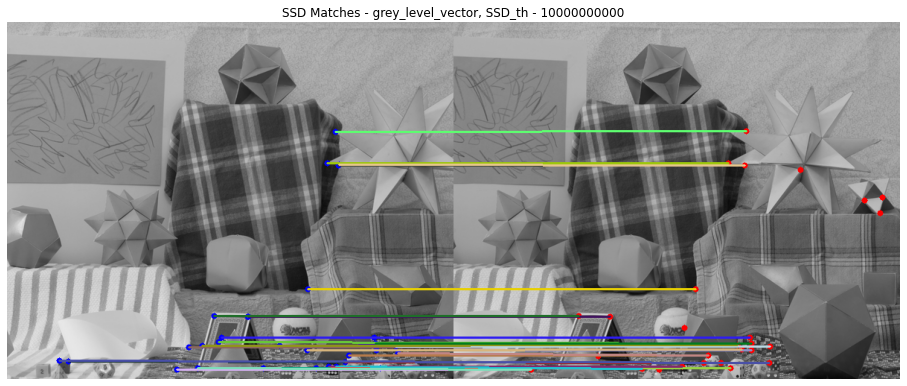

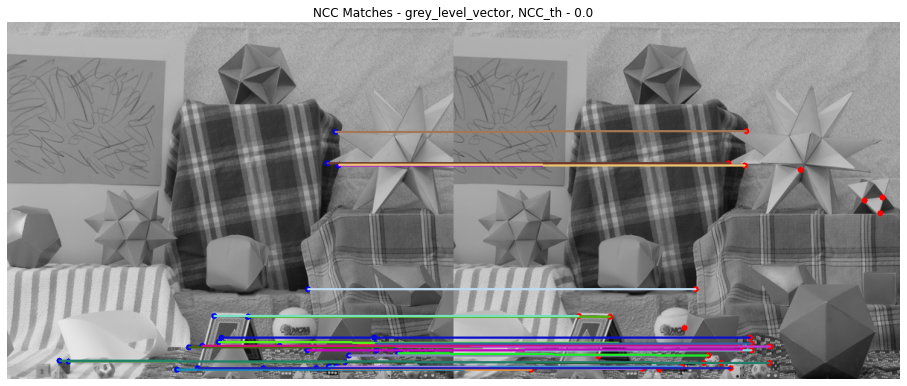

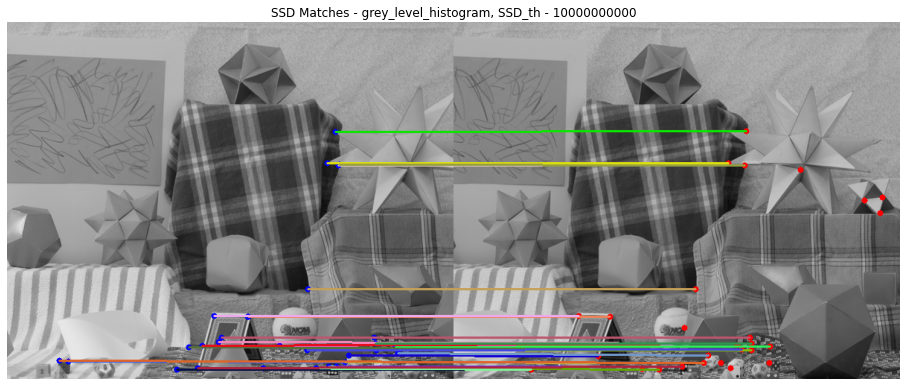

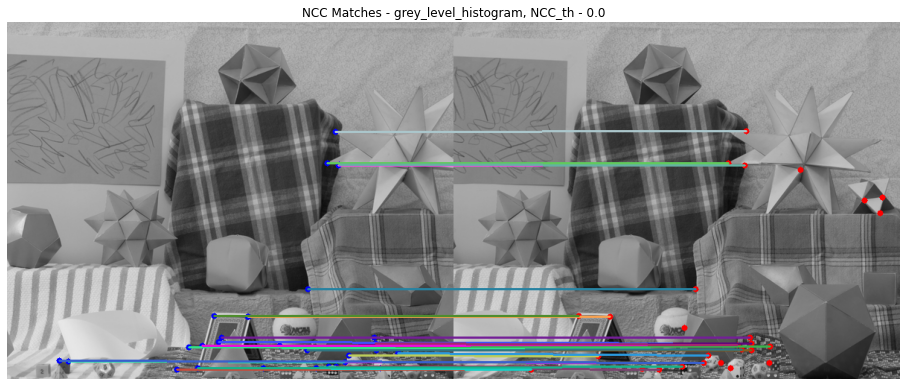

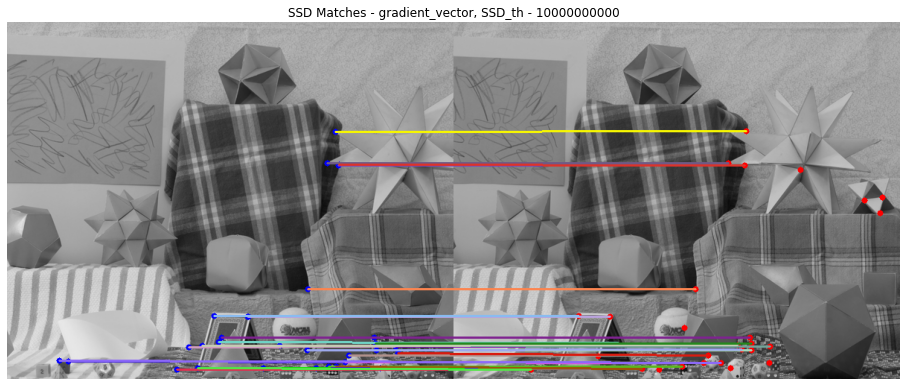

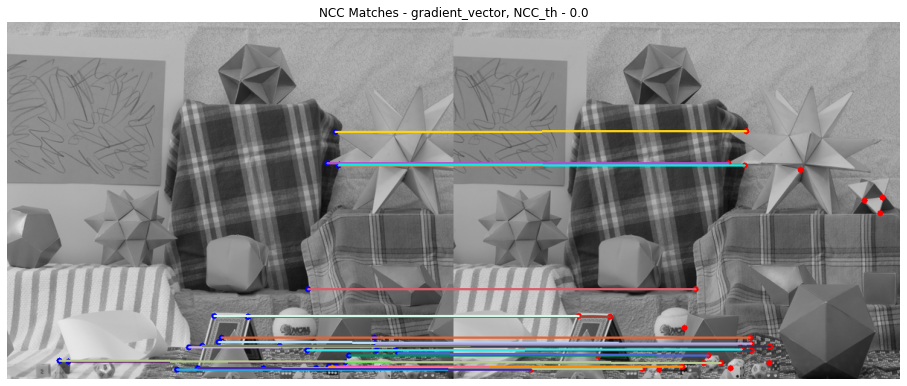

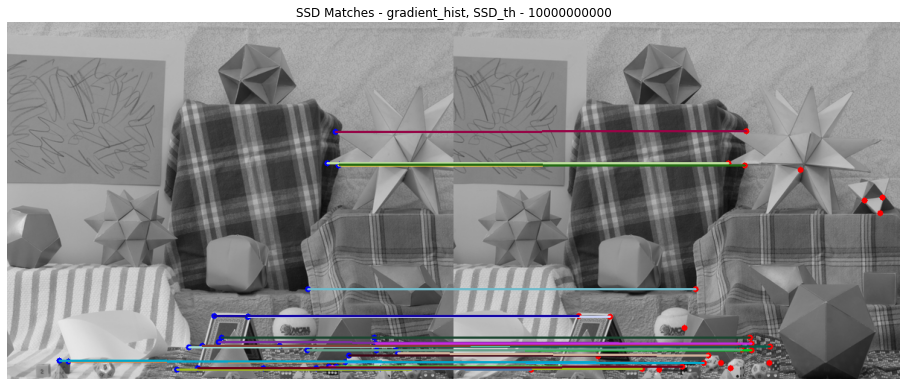

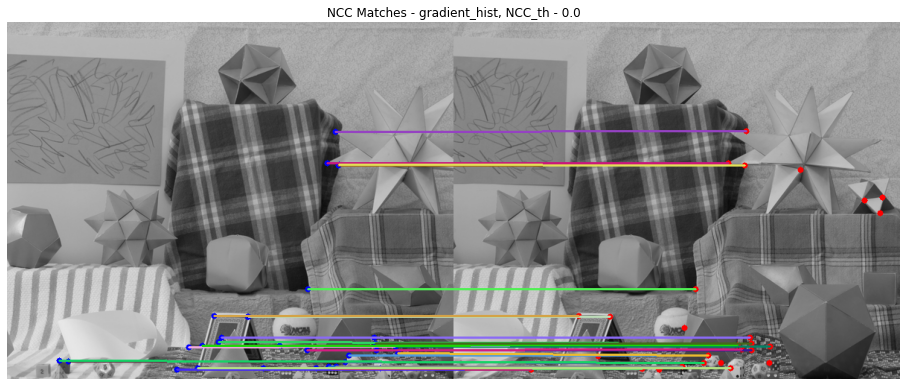

In [ ]:
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=20, number_of_corners=30, SSD_th=10**10, NCC_th=0.0, y_th=3)

## B.4 - SSD ratios

### Without y_th, d_ratio_th = 0.7, patch size = 10
Filter matches s.t $$ \frac{SSD(i,j)}{SSD(i,j')} <0.7 $$

In order to study the effectivenes of the ratio threshold, we fixed irrelevant threshold to SSD (10**10)

In [ ]:
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=50, SSD_th=10**10, d_ratio=True, d_ratio_th=0.7)

### Without y_th, d_ratio_th = 0.85 , patch size = 100
Bigger patch size than before


In [ ]:
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=100, number_of_corners=50, SSD_th=10**10, d_ratio=True, d_ratio_th=0.85)

### Demonstrate the effectivness of the ratio threshold:
descriptor: grey_level_vector:
1. without y_th ,without d_ratio, patch size = 20, number_of_corners=30
2. without y_th , d_ratio_th = 0.8 , patch size = 20, number_of_corners=30

descriptor: grey_level_histogram:
1. without y_th ,without d_ratio, patch size = 30, number_of_corners=40
2. without y_th , d_ratio_th = 0.5 , patch size = 30, number_of_corners=40

descriptor: gradient_vector:
1. without y_th ,without d_ratio, patch size = 30, number_of_corners=30
2. without y_th , d_ratio_th = 0.8 , patch size = 30, number_of_corners=30

descriptor: gradient_hist:
1. without y_th ,without d_ratio, patch size = 35, number_of_corners=40
2. without y_th , d_ratio_th = 0.65 , patch size = 35, number_of_corners=40

In [ ]:
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=20, number_of_corners=30,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], d_ratio=False, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=20, number_of_corners=30, descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)

match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=30, number_of_corners=40,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level_histogram'], d_ratio=False, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=30, number_of_corners=40, descriptors=[hist_patch_im],
                  descriptors_names=['grey_level_histogram'], d_ratio=True, d_ratio_th=0.5, NCC_display=False, ratio_hist_display=False)

match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=30, number_of_corners=30, descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=False, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=30, number_of_corners=30, descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)


match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=35, number_of_corners=40, descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=False, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=35, number_of_corners=40, descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=True, d_ratio_th=0.65, NCC_display=False, ratio_hist_display=False)


### y_th=3 , d_ratio_th = 0.85 , patch size = 20
Applying threshold of the y coordinate of the j vector - +- 3 from the y coordinate of the i vector

In [ ]:
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=20, number_of_corners=50, SSD_th=10**10,y_th=3, d_ratio=True, d_ratio_th=0.85)

## B.4 - Conclusions:
1. The ratio threshold achieves good results, though need a parameters optimization (ratio th, size of patch, number of corners, SSD threshold). For each kind of descriptors, diffrent paramters achives the best results. We will specify some in the next sections.
2. We can notice that there are diffrences between the ratios over grey level descriptors and gradient descriptors (vectors). Gradient descriptors, tend to have high ratios, thus need more tuning defining the threshold vs the number of corners.
3. The bigger the patch size is, the ratios tend to increase (logically - we have more common pixels among each corner's patch). Therefore, If you increase the patch size, you will find more matches that are more similar, thus the ratio th paramter needed to be fine tunned as well.
4. The histograms (grey level and gradient) with Large number of corners and a low threshold - In that way most of  corners, which are usually wrong, are filterd and the "good" corners "survive" the filtering. Yet, we need to hypertune the patch size together with the number of corners and the threshold.
5. In addition to section 4, it seems that the "highest" matchings (where the SSD ratio is samll, approximatly <0.5) are among the histograms. We conclude that with the threshold, the vectors tend to better matching, while the histograms tend to wrong and duplicated matchings, while with a fine-tuned ratio threshold, the histograms achives better results with the threshold, thus they are preferable.
5. Duplicated matchings are pretty common, espicially with high number of corners and a big size of a patch (which allows us to "gain" more matches), mostly among the histograms. The ratio threshold help filtering most of the duplications.
7. When Applying y_th (threshold on the y coordinate) the ratios are much smaller - logically, for each corner we filter optionaly matches, so we are left with less possible matches, thus SSD(i,j') should be equal or bigger with the threshold (the ratio can be therotically smaller, but tend to be bigger because for each corner the first and second matches tend to be not in the same y coordinate)
8. If we will tune for each descriptor SSD threshold we can improve the results as well.


## B.5


### Differences between diffrent descriptors:
#### All the test were done with no y threshold (assuming it is not realy intresting for "real" cases) and besides SSD VS NCC,  with ratio threshold 0.8 unless mentioned otherwise (effective tool for most kind of images comparness). The number of cormers is not in thousands in order to be able to interpret the results
#### Compare between vectors and histograms + grey-level and gradient. SSD only



In [ ]:
print('patch_size=10, number_of_corners=10:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=10,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=10,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level_histogram'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=15, number_of_corners=20:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=20,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=20,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level_histogram'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=15, number_of_corners=50:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level_histogram'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=25, number_of_corners=30:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level_histogram'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=25, number_of_corners=30, ratio=0.65:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], d_ratio=True, d_ratio_th=0.65, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level_histogram'], d_ratio=True, d_ratio_th=0.65, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=50, number_of_corners=50, SSD_th=10**7,:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50, SSD_th=10**7,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50, SSD_th=10**7,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level_histogram'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=50, number_of_corners=50, ratio=0.6:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50,descriptors=[patch_from_im],
                  descriptors_names=['gradient_vector'], d_ratio=True, d_ratio_th=0.6, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50,descriptors=[hist_patch_im],
                  descriptors_names=['gradient_hist'], d_ratio=True, d_ratio_th=0.6, NCC_display=False, ratio_hist_display=False)


#### Grey level vs Grey level histogram:

patch_size=10, number_of_corners=10 - both are inaccurate

patch_size=15, number_of_corners=20 - grey level histogram tend to create a bit more matches, less accurate

patch_size=15, number_of_corners=50 - similar number of matches, vector tend to be a bit more accurate

patch_size=25, number_of_corners=30 - vector is more accurate

patch_size=25, number_of_corners=30, ratio=0.65 (not 0.8) - vector is more accurate

patch_size=50, number_of_corners=50, SSD_th=10**7, - vector is much more accurate. SSD threshold can be effecrtive, though need to be tuned according to the corners and the descriptor.

patch_size=50, number_of_corners=50, ratio=0.6 (not 0.8) - Grey level vector with good results and high accuracy, grey level histograms with a bit more matchings, some are inaacurate

In [ ]:
print('patch_size=10, number_of_corners=10:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=10, descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=10,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=15, number_of_corners=20:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=20,descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=20,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=15, number_of_corners=50:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50,descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=25, number_of_corners=30:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=25, number_of_corners=30, ratio=0.65:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30, descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=True, d_ratio_th=0.65, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=True, d_ratio_th=0.65, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=50, number_of_corners=50:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50,descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=True, d_ratio_th=0.8, NCC_display=False, ratio_hist_display=False)
print('\npatch_size=50, number_of_corners=50, ratio=0.6, SSD threshold 10**8:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50, SSD_th=10**8, descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=True, d_ratio_th=0.6, NCC_display=False, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50, SSD_th=10**8,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=True, d_ratio_th=0.6, NCC_display=False, ratio_hist_display=False)


### Gradient vector vs Gradient histogram:

patch_size=10, number_of_corners=10 - Little number of matches, both are inaccurate

patch_size=15, number_of_corners=20 - Similar "hits", additional misses in the Gradient histogram. Gradient vector tend to "close" misses.

patch_size=15, number_of_corners=50 - Good results (high accuracy), Gradient histogram tend to additional misses

patch_size=25, number_of_corners=30 - Much less results than 50 corners. Gradient hist tend to inaccuracy

patch_size=25, number_of_corners=30, ratio=0.65 (not 0.8) - Small number of results. Gradient vector with very high accuracy, Gradient histogram with some inaccuracies.

patch_size=50, number_of_corners=50 - Multiple number of matchings, some are duplicated, low accuracy. Espicially in Gradien histogram

patch_size=50, number_of_corners=50, ratio=0.6 (not 0.8), SSD_th=10**8 - Gradient vector with only 1 matching, Gradient histograms with multiple number of matchings, few are inaccurate. SSD threshold can be effecrtive, though need to be tuned according to the corners and the descriptor (vector\histogram)


### Grey level vs Gradient:

- While the histograms tend to act pretty similar, with a bit more accuracy to the gradient hist, there are major diffrences between gradient vector to grey level vector.
- Grey level becomes relavent only with high number of corners and a big patch size together with a "tight" (low) ratio threshold. THe gradient vector is better with smaller patch size, though it needs a big number of corners, he deals well with a small patch size. Generally speaking, it seems that the gradient vector has better results and generally the gradient has better results, though it needs more fine tuning to the parameters (especially the ratio threshold)

### Vectors vs Histograms:
- Although the histograms acts pretty similar, comparing to the comparing to the vectors it depends. Either way, they work better with a big patch, high nunmber of corners and a tight ratio threshold
- In the gradient we couldn't find a major advantage to the histogram. After fine-tuning, in most cases the gradient vector performs better with higher accuracy.
- In the grey level, the histogram didn't outperfor, the vectors, although with tuning the ratio threshold together with the size of the patch it can reach a good accuracy.

In conclusion, generally - our favorite descriptor is the gradient vector, but  parameters tuning is necessary.

### SSD VS NCC
#### no ratio threshold

In [ ]:
print('patch_size=10, number_of_corners=10:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=10,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=10,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level__hist'], d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=10,descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=10, number_of_corners=10,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=False, NCC_display=True, ratio_hist_display=False)
print('\npatch_size=15, number_of_corners=50, NCC and SSD threshold apllied:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50, SSD_th=10**5, NCC_th=0.95, descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50, SSD_th=10**5, NCC_th=0.95, descriptors=[hist_patch_im],
                  descriptors_names=['grey_level__hist'], d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50, SSD_th=10**6, NCC_th=0.9,descriptors=[gradient],
                  descriptors_names=['gradient_vector'], d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50, SSD_th=10**6, NCC_th=0.9, descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], d_ratio=False, NCC_display=True, ratio_hist_display=False)
print('\npatch_size=15, number_of_corners=50, y_th=3:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level__hist'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50,descriptors=[gradient],
                  descriptors_names=['gradient_vector'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=15, number_of_corners=50,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
print('\npatch_size=25, number_of_corners=30, y_th=3:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level__hist'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[gradient],
                  descriptors_names=['gradient_vector'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=25, number_of_corners=30,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
print('\npatch_size=50, number_of_corners=50, y_th=3:\n')
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50,descriptors=[patch_from_im],
                  descriptors_names=['grey_level_vector'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50,descriptors=[hist_patch_im],
                  descriptors_names=['grey_level__hist'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50,descriptors=[gradient],
                  descriptors_names=['gradient_vector'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)
match_corners(img_1_dir='images/view0.tif', img_2_dir='images/view6.tif', patch_size=50, number_of_corners=50,descriptors=[hist_gradient],
                  descriptors_names=['gradient_hist'], y_th=3, d_ratio=False, NCC_display=True, ratio_hist_display=False)


### SSD vs NCC:

patch_size=10, number_of_corners=10 - around 50% accuracy, similar results

patch_size=15, number_of_corners=50 - Plenty of matches, some of them inaacurate. SSD and NCC Thresholds can be very effective, though need to be tuned according to all the other parameters. For both them the best results were in gradient.

patch_size=15, number_of_corners=50, y_th=3 - A lot of matches, very high accuracy in both of them

patch_size=25, number_of_corners=30 - A lot of matches, most of them inaacurate.

patch_size=25, number_of_corners=30, y_th=3  - Good results, very high accuracy in both of them

patch_size=50, number_of_corners=50, y_th=3 - A lot of matches, almost of them inaacurate.

Conclusion - Both methods are pretty similar, Without ratio threshold they both are irelevent, unless you add y threshold (which is not practical). In order to test examine the true difference, it should be done with ratio threshold. In conclusion - we didn't find any major difference between SSD and NCC (which is according to the way they are calculated - high NCC > LOW SSD)


## B.6

#### B.6.a
In Case 2, there are exponentially more incorrect matches. Firstly, if the y-threshold is not set too tightly (considering the minor differences between the images), it might only filter out incorrect matches in our specific images. Additionally, applying the ratio threshold might filter out a small number of correct matches due to the similarity between the images. However, it primarily eliminates incorrect matches. It is uncommon to find two corners (one in each image) with similar SSD and a significantly low ratio that results in an incorrect match. This low ratio indicates a substantial SSD difference between the corners, which have been identified as such by their properties (e.g., gradient) through the Harris detector algorithm. These properties are unique and statistically diverge from the average SSD to any other pixel.

Furthermore, when there is an incorrect match, it is usually either close to a correct match or another close match. This is because there are two or more similar corners in the image, as in the example discussed in class with the fence. In such cases, we lose a few correct matches but filter out a large portion of incorrect ones.

In conclusion, both filters demonstrated effective results in practice. While the y-threshold is highly effective, its applicability is limited because it must be adjusted for specific images. On the other hand, the SSD ratio also showed good results and is not confined to our specific set of matching images. Although the SSD ratio might filter out some correct matchings, significant corners will likely 'pass' the threshold, effectively reducing the majority of incorrect matchings.

Incorrect pair in case 2: SSD, grey level vector, patch size: 10, number of corners: 50, no thresholds (y nor ratio):

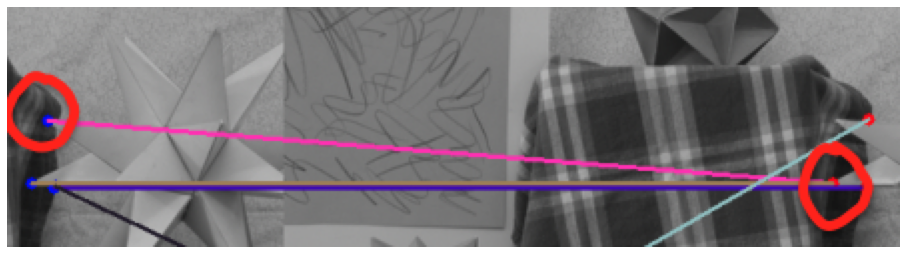

In [ ]:
img = cv2.imread('images/wrong_match_2.png')


img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

In the attached mismatched corner we can see 2 edges of the "star"  object. It is clearly that a y threshold would filter this match, but in addition, there multiple edges to this star object which are all similar, some of them even with similar background (like the 2 edges that were missclassified). That is why, probably, 1 of the thresholds (y, ratio or SSD) would have filtered this match.

Incorrect pair in case 3: NCC, gradient histogram, patch size: 20, number of corners: 30, y threshold: 3,  no ratio threshold, no NCC threshold:

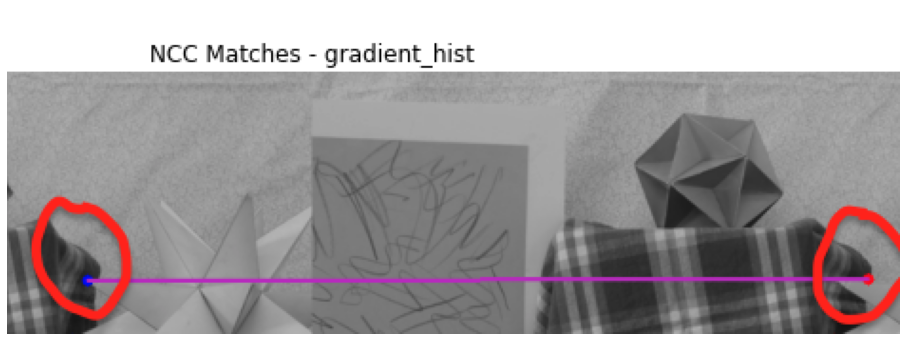

In [ ]:
img = cv2.imread('images/wrong_match_3.png')


img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

In this case, we can see that after applying the y threshold, we recieved a wrong match by the gradient hist. Foirst of all we can see that the wrong match is pretty close to the correct match, meaning it might even be part of the same shape. In addition we can see that because the diffrent angle of the photo, the intersection of the blanket, the background  and the star objectis is almost in the same place in both mages (regarding the rest of the star object to the left) - consequently causeing the gradients to be similar - and the gradient histogram as well.

Incorrect pair in case 4: NCC, gradient histogram, patch size: 10, number of corners: 50, ratio threshold: 0.7, no y threshold, no NCC threshold:

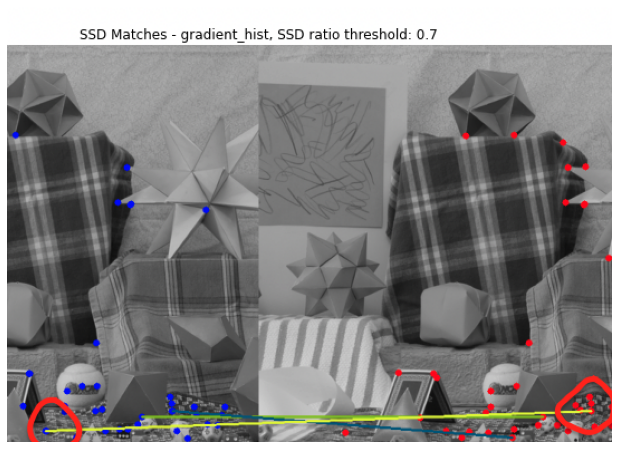

In [ ]:
img = cv2.imread('images/wrong_match_4.png')


img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

In this case we observe a missmatch using a SSD threshold of 0.7 with no y threshold. In both images the corners lays on the checkered carpet. In the right image we can see that the hidden part of the photo above is more "exposed", causing changes in the gradient, comparing to the true matching, while in the right image there is more exposed carpet near the false match, causing a similar "available" patch of carpet around the corner. Nevertheless, we wonder how come the other corners next to the wrong match weren't matched as well with similar SSD - becuase the wrong corner wasn't filtered by the distance ratio.

### B.7

In the two images discussed, the most reliable region is the top area, particularly around the star objects and the plaid blanket. There are several reasons for this:

- Due to the shape and colors of these objects, the corners are significant, leading to unique descriptors as well.

- The objects are large relative to an average patch size. In contrast, the bottom area contains many small objects, each with its own corners. This results in a dense area of corners with somewhat similar features, leading to similar descriptors, while the corners in the top area are "spaced".

- The top area features distinct 'black-white' edges — the transition between the blanket, the background wall, and the star objects is marked by significant color changes. On the other hand, the bottom area predominantly displays more 'averaged' gray colors. These colors can be interpreted as numerous other corners due to their less distinct nature.

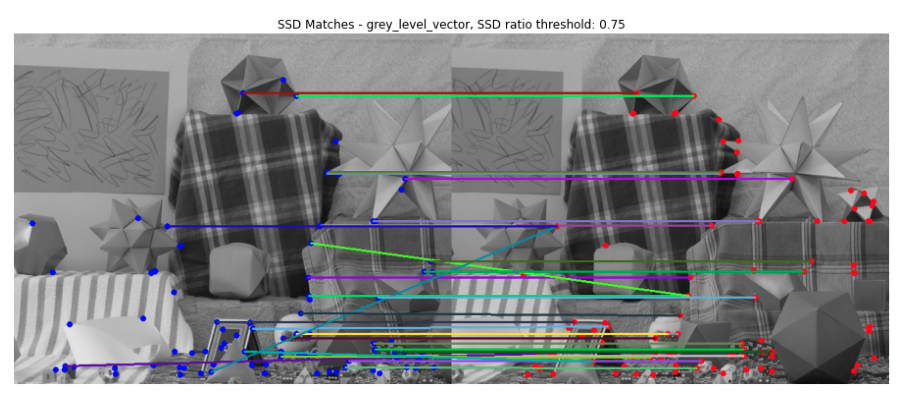

In [ ]:
img = cv2.imread('images/reliable_region.png')


img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

### Part C ##

In this part you will compute the 3D structure from a pair of rectified images.


**The input:**\
    **a.** A pair of two rectified images, $im1$ and $im2$ (*view1.png and view5.png*).\
    **b.** A window size $(s_x,s_y$).\
    **c.** Disparity range $(d_{min},d_{max})$ (see below).

**The output:**\
**a.** A matrix, $D$ with the disparity map for the left image.\
**b.** Three matrices X, Y, Z with the x, y, z-coordinates of each pixel in the left image. Assign zero for pixels for which the disparity was not computed.

Note: all matrices $im1, im2, D, X, Y, Z$ have the same dimensions.

**Instructions:**
1. Read the two images view1.png and view5.png, and apply the functions to this pair of images.

   
2. Write a function that receives two rectified images, and compute dense matching along lines with the same $y-$coordinate.
    * You can use any of the descriptors from Part B. The patch size should be given as a parameter.
    * Use NCC for the similarity measure.
    * You can assume that you are given the range of disparities, $d_{min},d_{max}$ as an input. \
      For example, if  $(d_{min},d_{max})=(20,120)$ it follows that the corresponding point of  $(x,y)$ in the left image, is in the range $(x-120:x-20,y)$ in the right image.
    * Consider matching with and without order preseving.
    * List all parameters you use for your function.
    * Hints on efficient implementation is given below.
    
        
3. Write a function that computes the disparity based on (2).  
    * **Display** the disparity $D$ map as an image
   
  
4. Compute the depth map using the disparity.
    * Assume that scaled focal lengths ($f$ in the presentation) are $α_x=α_y=1$.
    * The distance between the cameras is 160mm.
    * Add to your disparity depth map the value 100, since images were cropped.
    * Display the disparity as an image.
   

4. Compute the matrices X,Y,Z
    * Present the object given by X,Y,Z using a 3D plot.


**Implementation**\
You can implement the computation of the similarity and the disparity directly by an exhaustive search. You can also use the idea from Part B. A more efficeint and elegant way is described below. You are welcome to try, but you do not have to.


General idea for the **vectorized solution** (you will need to fill in the gaps):
* Let $w$ and $h$ we the width and the height of the image respectively.
* First assume that the patch size is $1\times s_y$.
* Given two $1\times w$ rows, $r_1$ and $r_2$ which are corresponding rows of the two images. Compute the $w\times w$ matrix $R12=r_1^T r_2$. The values $R12(i,j)$ consists of the product of two pixels $r_1(i)\cdot r_2(j)$.
* Convolve $R12$ with the $s_y\times s_y$ identity matrix, $I_{s_y}$ : $Corr=I_{s_y}*R12$. The value $Corr(i,j)$ is the correlation of the $s_y$ 1D neighborhood of $r_1(i)$ and  $r_2(j)$.
* Think about how to normalize this correlation using the same idea. Hint, use the computation of $I_{s_y}*(r_1^Tr_1)$ and $I_{s_y}*(r_2^Tr_2)$.
* For a general patch size, $s_x\times s_y$, define $R$ to be 3D matrix of size $h\times w\times s_x$ and use 3D mask for the convolution.
* Up to here, we considered each row seperately, hence we need to loop over all rows of the images. There is a way to do it without looping, but not in this assignemnt :)


## C.2 - compute dense matching of 2 rectified images
Parameters of the function:
- img_left_dir (string): directory of the left image.
- img_right_dir (string): directory of the right image.
- disparity_range (tuple): the range where the x value of all matching pixels can be in the range (x-d_max, x-d_min). Defaulted as given in the assignment (20,120)
- patch_size (int): size of the patch for the descriptors.
- descriptor (function): A name of the function to generate a descriptor. Defaulted to gradient
- descriptors_name (string): name of the descriptor. Defaulted 'gradient_vector'.
- preserved_order (boolean): Should a preserved order will be apllied or not (strict monotonic increasing condition)


In [ ]:
def matching_pixels(img_left_dir, img_right_dir, disparity_range=(20,120), patch_size=20, descriptor=gradient, descriptor_name='gradient_vector', preserved_order=False):
    """
    For each pixel in the left image, find the correspanding pixel in the right image
    (assuming it has the same y value and x value is in the disparity range)

    Parameters:
    - img_left_dir (string): directory of the left image.
    - img_right_dir (string): directory of the right image.
    - disparity_range (tuple): the range where the x value of all matching pixels can be in the range
            (x-d_max, x-d_min). Defaulted as given in the assignment (20,120)
    - patch_size (int): size of the patch for the descriptors.
    - descriptor (function): A Function to generate a descriptor. Defaulted to gradient
    - descriptors_name (string): name of the descriptor. Defaulted 'gradient_vector'.
    - preserved_order (boolean): Should a preserved order will be apllied or not (strict monotonic increasing condition)

    Returns a matrix with the coordinate of the matching pixels in the right image (for each pixel in the left image)
    """

    img_left = cv2.imread(img_left_dir,  cv2.IMREAD_GRAYSCALE)
    img_right = cv2.imread(img_right_dir,  cv2.IMREAD_GRAYSCALE)

    D = np.zeros(shape=img_left.shape)

    for i, left_row in enumerate(img_left):

        # Slice the right row
        right_row = img_right[i]
        # Create a list of coordinates (tuples) of all the pixel the row for each image in order to match to the format of the function below (coordinates(tuple), strength (float - irrelevant))
        left_coordinates = [((i, j), None) for j in range(len(left_row))]
        right_coordinates = [((i, j), None) for j in range(len(right_row))]

        # Generate a matrix of descriptors (as given input) for each row (push the value out of the dictionary using the key descriptor_name)

        # Rows of descriptors
        descriptors_img_left_matrix = generate_corners_descriptors(img=img_left, pixels=left_coordinates, patch_size=patch_size, vstack=True, descriptors=[descriptor], descriptors_names=[descriptor_name])[descriptor_name]
#         descriptors_img_1 = generate_corners_descriptors(img=img_1, pixels=img_1_strongest_corners, patch_size=patch_size, vstack=True, descriptors=descriptors, descriptors_names=descriptors_names)

        # Columns of descriptors
        descriptors_img_right_matrix = generate_corners_descriptors(img=img_right, pixels=right_coordinates, patch_size=patch_size, vstack=False, descriptors=[descriptor], descriptors_names=[descriptor_name])[descriptor_name]

        # Compute the NCC values of the descriptors
        M_NCC = Matrix_SSD_NCC(M_1=descriptors_img_left_matrix, M_2=descriptors_img_right_matrix, SSD_bol=False, NCC_bol=True)

        # Apply the disparity_range and fill the value 0 in each cell out of the disparity range
        M_NCC_disparity=disparity_mask(M=M_NCC, disparity_range=disparity_range)


        # Find the mathcing pixels and reshape before insterting the row to D
        matching_indices = disparity_map_row(M_NCC_disparity, preserved_order=preserved_order).reshape(1,-1)

        #Calculte the disparities
        indices = np.arange(matching_indices.shape[1])  # create a vector of indeces

        disparities = indices - matching_indices

        D[i] = disparities

    return D



def disparity_mask(M, disparity_range=(20,120), out_value=0.0):
    """
    Mask the disparity range on each row in M
    Parameters:
    - M (2D numpy array): a 2 dimension matrix, s.t each row represents a descriptor
    - disparity_range (tuple): the range where the x value of all matching pixels can be in the range
            (x-d_max, x-d_min). Defaulted as given in the assignment (20,120)
    - out_value (float): The Value to replace the cells out of the disparity range
    Returns a Matrix where in each row every cell out of the disparity range is replace with out_value
    """

    # Pull the values out of the tuple
    d_min, d_max = disparity_range

    # Number of rows and columns
    rows, cols = M.shape

    # Create a vector of column indices
    col_indices = np.arange(cols)


    # Create a vector of the same shape where each element in row i is i
    row_indices = np.arange(rows)[:, None]


    # Determine the valid range for each row
    valid_min = row_indices - d_max
    valid_max = row_indices - d_min

    # Create the mask for out-of-range values
    out_of_range_mask = (col_indices < valid_min) | (col_indices > valid_max)

    # Set out-of-range values to out_value
    M_disparity = M.copy()
    M_disparity[out_of_range_mask] = out_value
    return M_disparity



def disparity_map_row(M_NCC, preserved_order=False):
    """
    For a given squared matrix of NCC values (rows represents pixels indeces in a row in an image,
    columns are tha NCC values of the same row in a compared image) compute the matching pixels.
    Find the indices of the minimum values in each row of a matrix such that
    for each row i, the index of the minimum value in row i is less than
    the index of the minimum value in any row j where j > i.

    Parameters:
    M_NCC (np.ndarray): A 2D NumPy array
    preserved_order (boolean): Should a preserved order will be apllied or not (strict monotonic increasing condition)
    Returns:
    A vector length of the row representing the matching column index as value in each cell
    (the index is the column index in the first image).
    """


    # Find indices of minimum values in each row
    max_indices = np.argmax(M_NCC, axis=1)

    if preserved_order:
        # Apply cumulative maximum to ensure strictly monotonic increase
        cumulative_max_indices = np.maximum.accumulate(max_indices)
        return cumulative_max_indices

    if not preserved_order:
        return max_indices




## C.3:
The following results are after hyperparamterizing of the patch_size, with\without order preseving and kind of descriptor.
The best results were for patch_size=3, without order preseving. Between the descriptors, the gradient achieves better shape (curving, proportion) of objects, while the gray level is better in discriminate the partterns of objects and We attach the results of the disparity map with order preseving and for gradient descriptor.

The following results are obtained after hyperparameter tuning of the patch_size, considering both with and without order preserving and 2 types of descriptors. The optimal results were observed for patch_size=3 without order preserving. Comparing the descriptors, the gradient descriptor excels in capturing the shape, including curving and proportion, of objects. On the other hand, the gray level descriptor proves to be more effective in discerning patterns within objects. We will continue with both descriptors to the next sections. We provide the results of the disparity map with order preserving as well.

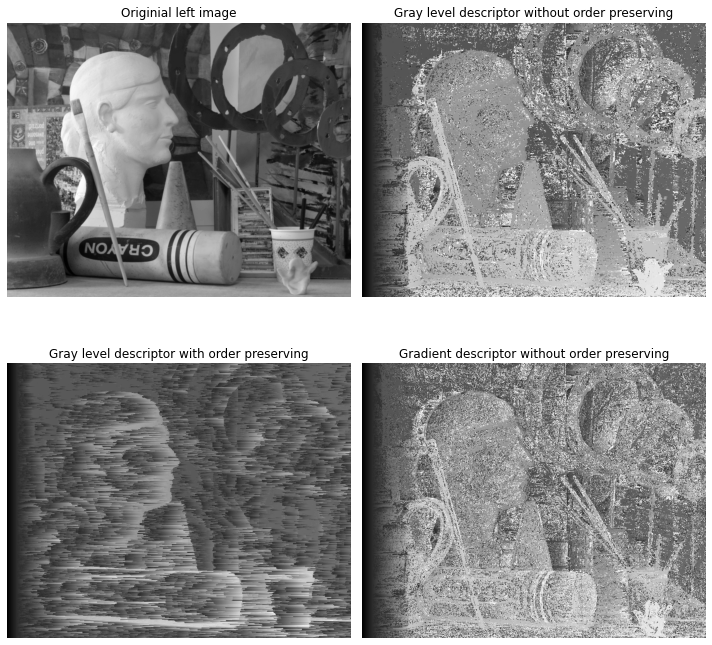

In [ ]:
img_left_dir = 'images/view1.tif'
img_right_dir = 'images/view5.tif'

img_left = cv2.imread(img_left_dir,  cv2.IMREAD_GRAYSCALE)

# Gray level descriptor without order preserving
D_gray = matching_pixels(img_left_dir=img_left_dir, img_right_dir=img_right_dir,patch_size=3, descriptor=patch_from_im, descriptor_name='grey_level_vector', preserved_order=False)

# Gray level descriptor with order preserving
D_order_preservered = matching_pixels(img_left_dir=img_left_dir, img_right_dir=img_right_dir,patch_size=3, descriptor=patch_from_im, descriptor_name='grey_level_vector', preserved_order=True)

# Gradient descriptor without order preserving
D_gradient = matching_pixels(img_left_dir=img_left_dir, img_right_dir=img_right_dir,patch_size=3, descriptor=gradient, descriptor_name='gredient_vector', preserved_order=False)


# Plot the results using 4 axes plot

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs[0, 0].imshow(img_left, cmap='gray')
axs[0, 0].axis('off')
axs[0, 0].set_title('Originial left image')

axs[0, 1].imshow(D_gray, cmap='gray')
axs[0, 1].axis('off')
axs[0, 1].set_title('Gray level descriptor without order preserving')

axs[1, 0].imshow(D_order_preservered, cmap='gray')
axs[1, 0].axis('off')
axs[1, 0].set_title('Gray level descriptor with order preserving')

axs[1, 1].imshow(D_gradient, cmap='gray')
axs[1, 1].axis('off')
axs[1, 1].set_title('Gradient descriptor without order preserving')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

## C.4:  
We computed the depth map for both the gradient and for the gray level descriptors. In order to deal with "outliers" (the left part of the left image and etc.) we normalized the image using percentile.

In [ ]:
def Compute_depth_map(D, f=1.0, T=160.0):
    """
    Compute the depth map from a disparity map.

    Parameters:
    D (2D numpy array): The disparity map, a 2D array where each element represents the disparity value.
    f (float, optional): The scaled focal length of the camera. Defaults to 1.0.
    T (float, optional): The distance between the two cameras (baseline) in millimeters. Defaults to 160.0.

    Returns:
    2D numpy array: The depth map, a 2D array where each element represents the depth value.

    The depth for each pixel is calculated using the formula: depth = (f * T) / disparity.
    """

    # Initialize depth_map with zeros (same shape as D)
#     depth_map = np.ones(D, dtype=float)

    # Change zeroes to epsilon (for the devision)
    epsilon = np.finfo(float).eps
    D = np.where(D == 0, epsilon, D)

    # Calculate the depth map
    depth_map = (f*T)/D

    # Add to the disparity depth map the value 100, since images were cropped.
    depth_map += 100

    return depth_map

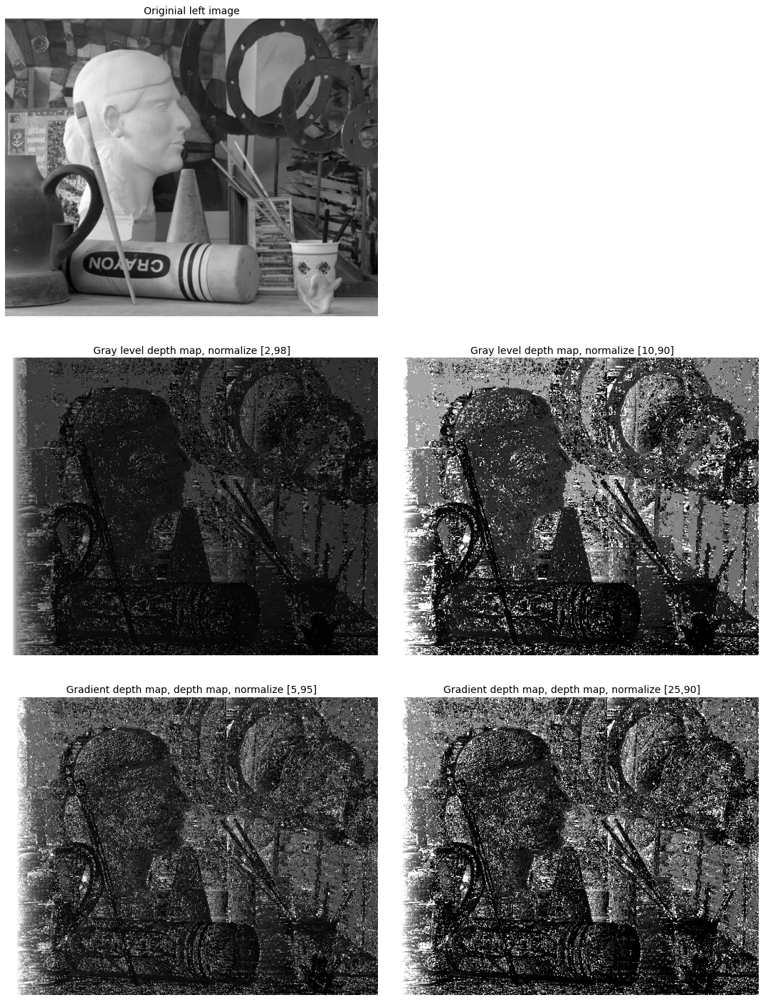

In [ ]:
# Compute the depth map for gray and greadient descriptors
D_gray_depth_map=Compute_depth_map(D=D_gray)
D_gradient_depth_map=Compute_depth_map(D=D_gradient)

fig, axs = plt.subplots(3, 2, figsize=(15, 20))

# Show the first image in the top row
axs[0, 0].imshow(img_left, cmap='gray')
axs[0, 0].axis('off')
axs[0, 0].set_title('Originial left image', fontsize=14)

# Leave an empty space in the middle (adjust the position manually)
axs[0, 1].axis('off')


# Calculate the percentiles of gray level for normalization
vmin_gray1, vmax_gray1 = np.percentile(D_gray_depth_map, [2, 98])
axs[1, 0].imshow(D_gray_depth_map, cmap='gray', vmin=vmin_gray1, vmax=vmax_gray1)
axs[1, 0].axis('off')
axs[1, 0].set_title('Gray level depth map, normalize [2,98]', fontsize=14)

# Different percentile
vmin_gray2, vmax_gray2 = np.percentile(D_gray_depth_map, [10, 90])
axs[1, 1].imshow(D_gray_depth_map, cmap='gray', vmin=vmin_gray2, vmax=vmax_gray2)
axs[1, 1].axis('off')
axs[1, 1].set_title('Gray level depth map, normalize [10,90]', fontsize=14)

# Calculate the percentiles of gradient for normalization
vmin_gradient1, vmax_gradient1 = np.percentile(D_gradient_depth_map, [5, 95])
axs[2, 0].imshow(D_gradient_depth_map, cmap='gray', vmin=vmin_gradient1, vmax=vmax_gradient1)
axs[2, 0].axis('off')
axs[2, 0].set_title('Gradient depth map, depth map, normalize [5,95]', fontsize=14)

# Different percentilex
vmin_gradient2, vmax_gradient2 = np.percentile(D_gradient_depth_map, [25, 90])
axs[2, 1].imshow(D_gradient_depth_map, cmap='gray', vmin=vmin_gradient2, vmax=vmax_gradient2)
axs[2, 1].axis('off')
axs[2, 1].set_title('Gradient depth map, depth map, normalize [25,90]', fontsize=14)
# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

### C.5
In this section we plotted each descriptorv(gray level and gradient) twice for different percintiles of that depth map.

In [ ]:
def Compute_coordinates(img_left_dir, depth_map, f=1.0, per_min=20, per_max=80):
    """
    Compute the real-world coordinates (X, Y, Z) for each pixel in the left image.

    Parameters:
    img_left_dir (string): directory of the left image.
    depth_map (2D numpy array): The depth map corresponding to the left image.
    f (float, optional): The scaled focal length of the camera. Defaults to 1.0.

    Returns:
    tuple: Three 2D numpy arrays (X, Y, Z) representing the real-world coordinates of each pixel.
           Returns None if img_left and depth_map have different dimensions.

    The coordinates are calculated as follows:
    - Z is a copy of depth_map.
    - X[i, j] = (i * Z[i, j]) / f
    - Y[i, j] = (j * Z[i, j]) / f
    """
    img_left = cv2.imread(img_left_dir,  cv2.IMREAD_GRAYSCALE)
    # Check if img_left and depth_map have the same dimensions
    if img_left.shape != depth_map.shape:
        print("Error: img_left and depth_map must have the same dimensions.")
        return None

    # Determine outlier thresholds
    depth_min, depth_max = np.percentile(depth_map, [per_min, per_max])

    # Set outliers to NaN
    depth_map = np.where((depth_map < depth_min) | (depth_map > depth_max), np.nan, depth_map)


    # Z is a copy of the depth map
    Z = np.copy(depth_map)

    # Generate meshgrid for pixel indices
    rows, cols = img_left.shape
    j, i = np.meshgrid(np.arange(cols), np.arange(rows))

    # Compute X and Y using the formulae


    Y = (i * Z) / f
    X = (j * Z) / f


    return X, Y, Z

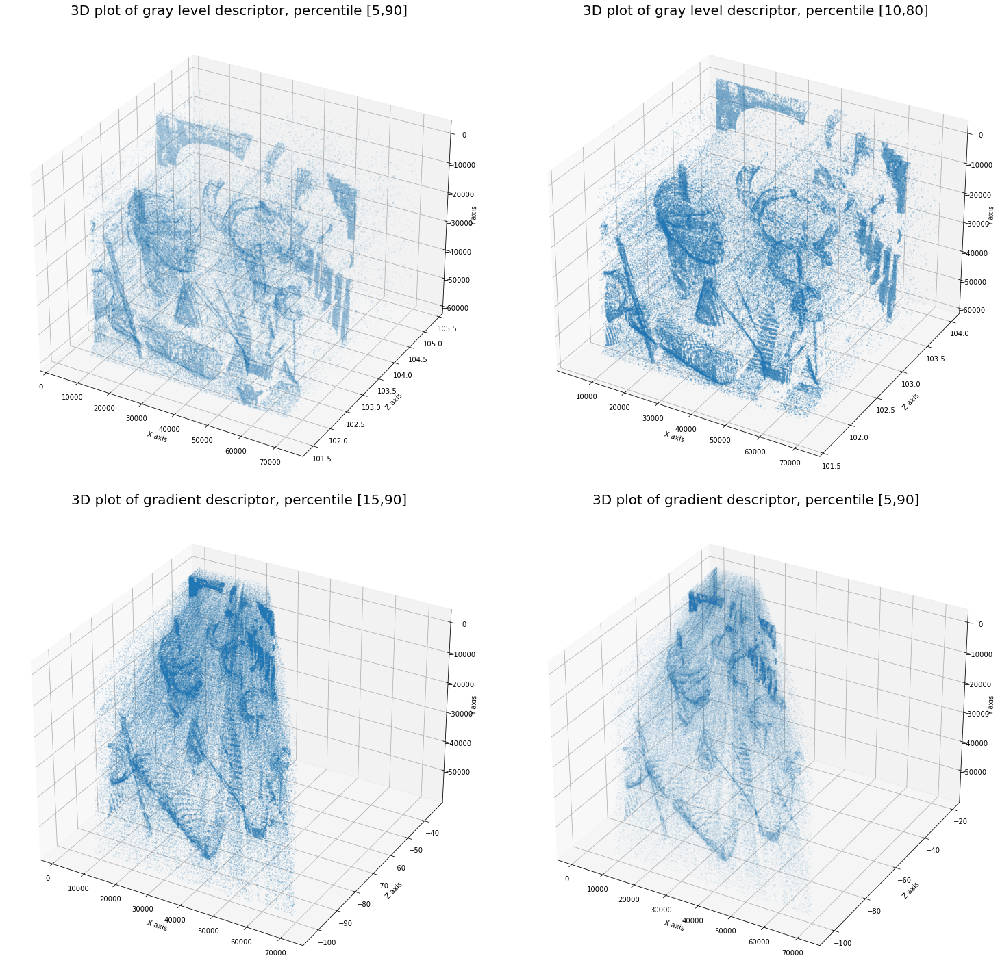

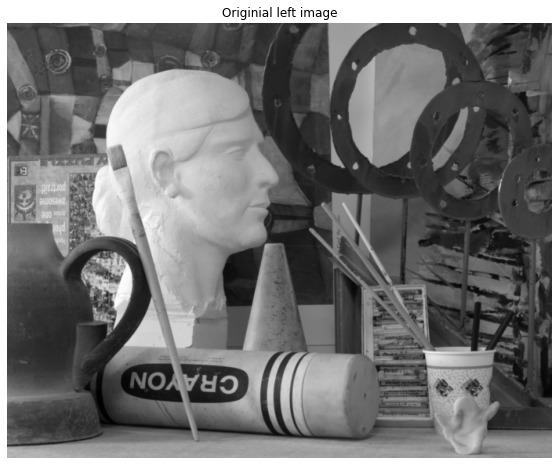

In [ ]:
img_left_dir = 'images/view1.tif'
img_left = cv2.imread(img_left_dir,  cv2.IMREAD_GRAYSCALE)



# Create a figure with a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(22, 20), subplot_kw={'projection': '3d'})

X,Y,Z = Compute_coordinates(img_left_dir = img_left_dir, depth_map=D_gray_depth_map, f=1.0, per_min=5, per_max=90)
# Scatter plot each pixel. Flatten the X, Y, Z arrays to convert them from 2D to 1D.
axs[0, 0].scatter(X.flatten(), Z.flatten(), -Y.flatten(),  marker='.', s=0.01)
# Setting labels
axs[0, 0].set_xlabel('X axis')
axs[0, 0].set_ylabel('Z axis')
axs[0, 0].set_zlabel('Y axis')
axs[0, 0].set_title('3D plot of gray level descriptor, percentile [5,90]', fontsize=20)


X,Y,Z = Compute_coordinates(img_left_dir = img_left_dir, depth_map=D_gray_depth_map, f=1.0, per_min=10, per_max=80)
# Scatter plot each pixel. Flatten the X, Y, Z arrays to convert them from 2D to 1D.
axs[0, 1].scatter(X.flatten(), Z.flatten(), -Y.flatten(),  marker='.', s=0.05)
# Setting labels
axs[0, 1].set_xlabel('X axis')
axs[0, 1].set_ylabel('Z axis')
axs[0, 1].set_zlabel('Y axis')
axs[0, 1].set_title('3D plot of gray level descriptor, percentile [10,80]', fontsize=20)


X,Y,Z = Compute_coordinates(img_left_dir = img_left_dir, depth_map=D_gradient, f=1.0, per_min=15, per_max=90)
# Scatter plot each pixel. Flatten the X, Y, Z arrays to convert them from 2D to 1D.
axs[1, 0].scatter(X.flatten(), -Z.flatten(), -Y.flatten(),  marker='.', s=0.05)
# Setting labels
axs[1, 0].set_xlabel('X axis')
axs[1, 0].set_ylabel('Z axis')
axs[1, 0].set_zlabel('Y axis')
axs[1, 0].set_title('3D plot of gradient descriptor, percentile [15,90]', fontsize=20)



X,Y,Z = Compute_coordinates(img_left_dir = img_left_dir, depth_map=D_gradient, f=1.0, per_min=5, per_max=90)
# Scatter plot each pixel. Flatten the X, Y, Z arrays to convert them from 2D to 1D.
axs[1, 1].scatter(X.flatten(), -Z.flatten(), -Y.flatten(),  marker='.', s=0.01)
# Setting labels
axs[1, 1].set_xlabel('X axis')
axs[1, 1].set_ylabel('Z axis')
axs[1, 1].set_zlabel('Y axis')
axs[1, 1].set_title('3D plot of gradient descriptor, percentile [5,90]', fontsize=20)


# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

# Show the original Image
plt.figure(figsize=(12, 8))
plt.imshow(img_left, cmap='gray')
plt.title(f'Originial left image')
plt.axis('off')
plt.show()

In this section, we experimented with the normalization of the two descriptors to observe different aspects of the image. It is evident that, between the two descriptors, the gray level descriptor yields better results in the 3D depth plot. Firstly, the gradient is not straightened (this could potentially be addressed by adjusting a parameter during depth map calculation). Secondly, the scatter is much more dispersed in the gradient, resulting in fewer discernible patterns of objects. Nevertheless, the gradient descriptor adds a bit more depth to the objects, as noticeable in the head-shaped statue.